# Data Mining Lab 2
In this lab session we will focus on the use of Neural Word Embeddings and exploring some basic open source LLMs' applications to data.

## Table of Contents
1. Data preparation
2. Feature engineering
3. Model
4. Results evaluation
5. Other things you could try
6. Deep Learning
7. Word to Vector
8. Clustering
9. High-dimension Visualization
10. Large Language Models (LLMs)


### Necessary Library Requirements:

#### Same as Lab1 except PAMI:
- [Jupyter](http://jupyter.org/) (Strongly recommended but not required)
    - Install via `pip3 install jupyter` and use `jupyter notebook` in terminal to run
- [Scikit Learn](http://scikit-learn.org/stable/index.html)
    - Install via `pip3 install scikit-learn` from a terminal
- [Pandas](http://pandas.pydata.org/)
    - Install via `pip3 install pandas` from a terminal
- [Numpy](http://www.numpy.org/)
    - Install via `pip3 install numpy` from a terminal
- [Matplotlib](https://matplotlib.org/)
    - Install via `pip3 install maplotlib` from a terminal
- [Plotly](https://plot.ly/)
    - Install via `pip3 install plotly` from a terminal
- [Seaborn](https://seaborn.pydata.org/)
    - Install via `pip3 install seaborn`
- [NLTK](http://www.nltk.org/)
    - Install via `pip3 install nltk` from a terminal
- [UMAP](https://umap-learn.readthedocs.io/en/latest/)
    - Install via `pip3 install umap-learn` from a terminal
    

#### New Libraries to install:
- [Gensim](https://pypi.org/project/gensim/)
    - Install via `pip3 install gensim`

- [tensorflow](https://www.tensorflow.org/)
    - Install via `pip3 install tensorflow`
    - Also install `pip3 install tensorflow-hub`

- [Keras](https://keras.io/)
    - Install via `pip3 install keras`

- [Ollama](https://ollama.com)
    - Install via `pip3 install ollama`

- [langchain](https://www.langchain.com)
    - Install via `pip3 install langchain`
    - Also install `pip3 install langchain_community`
    - Also install `pip3 install langchain_core`
    
- [beautifulsoup4](https://pypi.org/project/beautifulsoup4/)
    - Install via `pip3 install beautifulsoup4`
    
- [chromadb](https://www.trychroma.com)
    - Install via `pip3 install chromadb`
    
- [gradio](https://www.gradio.app)
    - Install via `pip3 install gradio`
    
#### Open-source LLMs to install:
- ollama run llama3.2
- ollama run llama3.2:1b  (optional if the first one is too big)
- ollama run llava-phi3

---
## Introduction

**Dataset:** [SemEval 2017 Task](https://competitions.codalab.org/competitions/16380)

**Task:** Classify text data into 4 different emotions using word embeddings and other deep information retrieval approaches.

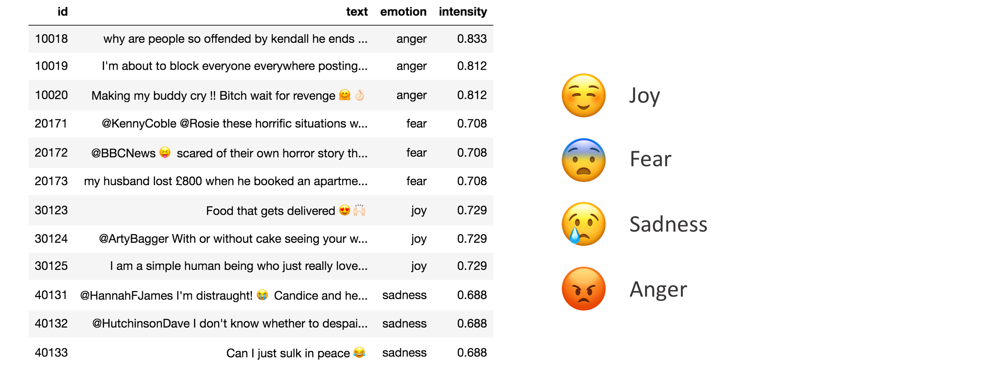

---
## 1. Data Preparation

Before beggining the lab, please make sure to download the [Google News Dataset](https://drive.google.com/file/d/0B7XkCwpI5KDYNlNUTTlSS21pQmM/edit) and place it in a folder named "GoogleNews" in the same directory as this file.

## 1.1 Load data

We start by loading the csv files into a single pandas dataframe for training and one for testing.

In [9]:
import pandas as pd

### training data
anger_train = pd.read_csv("data/semeval/train/anger-ratings-0to1.train.txt",
                         sep="\t", header=None,names=["id", "text", "emotion", "intensity"])
sadness_train = pd.read_csv("data/semeval/train/sadness-ratings-0to1.train.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
fear_train = pd.read_csv("data/semeval/train/fear-ratings-0to1.train.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
joy_train = pd.read_csv("data/semeval/train/joy-ratings-0to1.train.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])

In [10]:
# combine 4 sub-dataset
train_df = pd.concat([anger_train, fear_train, joy_train, sadness_train], ignore_index=True)

In [11]:
### testing data
anger_test = pd.read_csv("data/semeval/dev/anger-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
sadness_test = pd.read_csv("data/semeval/dev/sadness-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
fear_test = pd.read_csv("data/semeval/dev/fear-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
joy_test = pd.read_csv("data/semeval/dev/joy-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])

# combine 4 sub-dataset
test_df = pd.concat([anger_test, fear_test, joy_test, sadness_test], ignore_index=True)
train_df.head()

,id,text,emotion,intensity
0,10000,How the fu*k! Who the heck! moved my fridge!.....,anger,0.938
1,10001,So my Indian Uber driver just called someone t...,anger,0.896
2,10002,@DPD_UK I asked for my parcel to be delivered ...,anger,0.896
3,10003,so ef whichever butt wipe pulled the fire alar...,anger,0.896
4,10004,Don't join @BTCare they put the phone down on ...,anger,0.896


In [12]:
# shuffle dataset
train_df = train_df.sample(frac=1)
test_df = test_df.sample(frac=1)

In [13]:
print("Shape of Training df: ", train_df.shape)
print("Shape of Testing df: ", test_df.shape)

Shape of Training df:  (3613, 4)
Shape of Testing df:  (347, 4)


---
### ** >>> Exercise 1 (Take home): **  
Plot word frequency for Top 30 words in both train and test dataset. (Hint: refer to DM lab 1)


In [14]:
# Answer here
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
import plotly.express as px

# text extraction
train_texts = train_df['text'].fillna('')  
test_texts = test_df['text'].fillna('')

# word frequency
count_vect = CountVectorizer()
train_term_matrix = count_vect.fit_transform(train_texts)
test_term_matrix = count_vect.transform(test_texts)

train_term_frequencies = np.array(train_term_matrix.sum(axis=0)).flatten()
test_term_frequencies = np.array(test_term_matrix.sum(axis=0)).flatten()


top_n = 30

# training set
train_top_terms_idx = train_term_frequencies.argsort()[-top_n:][::-1]
train_top_terms = count_vect.get_feature_names_out()[train_top_terms_idx]
train_top_frequencies = train_term_frequencies[train_top_terms_idx]

# testing set
test_top_terms_idx = test_term_frequencies.argsort()[-top_n:][::-1]
test_top_terms = count_vect.get_feature_names_out()[test_top_terms_idx]
test_top_frequencies = test_term_frequencies[test_top_terms_idx]

# plot
# train
train_fig = px.bar(x=train_top_terms, y=train_top_frequencies,
                   labels={'x': 'Terms', 'y': 'Frequencies'},
                   title='Top 30 Term Frequencies in Training Dataset')
train_fig.update_layout(xaxis_tickangle=-90, height=600, width=1000)
train_fig.show()

# test
test_fig = px.bar(x=test_top_terms, y=test_top_frequencies,
                  labels={'x': 'Terms', 'y': 'Frequencies'},
                  title='Top 30 Term Frequencies in Testing Dataset')
test_fig.update_layout(xaxis_tickangle=-90, height=600, width=1000)
test_fig.show()


---
### 1.2 Save data

We will save our data in Pickle format. The pickle module implements binary protocols for serializing and de-serializing a Python object structure.   
  
Some advantages for using pickle structure:  
* Because it stores the attribute type, it's more convenient for cross-platform use.  
* When your data is huge, it could use less space to store also consume less loading time.   

In [15]:
## save to pickle file
train_df.to_pickle("train_df.pkl") 
test_df.to_pickle("test_df.pkl")

In [16]:
import pandas as pd

## load a pickle file
train_df = pd.read_pickle("train_df.pkl")
test_df = pd.read_pickle("test_df.pkl")

For more information: https://reurl.cc/0Dzqx

---
### 1.3 Exploratory data analysis (EDA)

Again, before getting our hands dirty, we need to explore a little bit and understand the data we're dealing with.

In [17]:
# group to find distribution
train_df.groupby(['emotion']).count()['text']

emotion
anger       857
fear       1147
joy         823
sadness     786
Name: text, dtype: int64

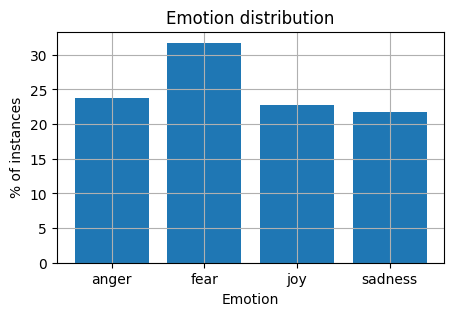

In [18]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

# the histogram of the data
labels = train_df['emotion'].unique()
post_total = len(train_df)
df1 = train_df.groupby(['emotion']).count()['text']
df1 = df1.apply(lambda x: round(x*100/post_total,3))

#plot
fig, ax = plt.subplots(figsize=(5,3))
plt.bar(df1.index,df1.values)

#arrange
plt.ylabel('% of instances')
plt.xlabel('Emotion')
plt.title('Emotion distribution')
plt.grid(True)
plt.show()

---

## 2. Feature engineering
### Using Bag of Words
Using scikit-learn ```CountVectorizer``` perform word frequency and use these as features to train a model.  
http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html

In [19]:
from sklearn.feature_extraction.text import CountVectorizer

In [20]:
# build analyzers (bag-of-words)
BOW_vectorizer = CountVectorizer() 

In [21]:
# 1. Learn a vocabulary dictionary of all tokens in the raw documents.
BOW_vectorizer.fit(train_df['text'])

# 2. Transform documents to document-term matrix.
train_data_BOW_features = BOW_vectorizer.transform(train_df['text'])
test_data_BOW_features = BOW_vectorizer.transform(test_df['text'])

In [22]:
# check the result
train_data_BOW_features

<3613x10115 sparse matrix of type '<class 'numpy.int64'>'
	with 51467 stored elements in Compressed Sparse Row format>

In [23]:
type(train_data_BOW_features)

scipy.sparse._csr.csr_matrix

In [24]:
# add .toarray() to show
train_data_BOW_features.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [25]:
# check the dimension
train_data_BOW_features.shape

(3613, 10115)

In [26]:
# observe some feature names
feature_names = BOW_vectorizer.get_feature_names_out()
feature_names[100:110]

array(['2k17', '2much', '2nd', '30', '300', '301', '30am', '30pm', '30s',
       '31'], dtype=object)

The embedding is done. We can technically feed this into our model. However, depending on the embedding technique you use and your model, your accuracy might not be as high, because:

* curse of dimensionality  (we have 10,115 dimension now)
* some important features are ignored (for example, some models using emoticons yeld better performance than counterparts)

In [27]:
"😂" in feature_names

False

Let's try using another tokenizer below.

In [28]:
import nltk

# build analyzers (bag-of-words)
BOW_500 = CountVectorizer(max_features=500, tokenizer=nltk.word_tokenize) 

# apply analyzer to training data
BOW_500.fit(train_df['text'])

train_data_BOW_features_500 = BOW_500.transform(train_df['text'])

## check dimension
train_data_BOW_features_500.shape

C:\Users\willy\anaconda3\envs\DataMining\lib\site-packages\sklearn\feature_extraction\text.py:521: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



(3613, 500)

In [29]:
train_data_BOW_features_500.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 4, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [30]:
# observe some feature names
feature_names_500 = BOW_500.get_feature_names_out()
feature_names_500[100:110]

array(['change', 'cheer', 'cheerful', 'cheerfully', 'cheering', 'cheery',
       'come', 'comes', 'could', 'country'], dtype=object)

In [31]:
"😂" in feature_names_500

True

---
###  **>>> Exercise 2 (Take home): **  
Generate an embedding using the TF-IDF vectorizer instead of th BOW one with 1000 features and show the feature names for features [100:110].

In [32]:
# Answer here
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer = TfidfVectorizer(max_features=1000)

tfidf_matrix = tfidf_vectorizer.fit_transform(test_texts)

feature_names = tfidf_vectorizer.get_feature_names_out()

print("features[100:110]:", feature_names[100:110])


features[100:110]: ['bout' 'box' 'boy' 'brace' 'braved' 'bread' 'breezy' 'brewing' 'brian'
 'brilliant']


---
## 3. Model
### 3.1 Decision Trees
Using scikit-learn ```DecisionTreeClassifier``` performs word frequency and uses these as features to train a model.  
http://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier

In [33]:
from sklearn.tree import DecisionTreeClassifier

# for a classificaiton problem, you need to provide both training & testing data
X_train = BOW_500.transform(train_df['text'])
y_train = train_df['emotion']

X_test = BOW_500.transform(test_df['text'])
y_test = test_df['emotion']

## take a look at data dimension is a good habit  :)
print('X_train.shape: ', X_train.shape)
print('y_train.shape: ', y_train.shape)
print('X_test.shape: ', X_test.shape)
print('y_test.shape: ', y_test.shape)

X_train.shape:  (3613, 500)
y_train.shape:  (3613,)
X_test.shape:  (347, 500)
y_test.shape:  (347,)


In [34]:
## build DecisionTree model
DT_model = DecisionTreeClassifier(random_state=1)

## training!
DT_model = DT_model.fit(X_train, y_train)

## predict!
y_train_pred = DT_model.predict(X_train)
y_test_pred = DT_model.predict(X_test)

## so we get the pred result
y_test_pred[:10]

array(['fear', 'fear', 'anger', 'fear', 'fear', 'sadness', 'sadness',
       'anger', 'sadness', 'anger'], dtype=object)

---
## 4. Results Evaluation

Now we will check the results of our model's performance

In [35]:
## accuracy
from sklearn.metrics import accuracy_score

acc_train = accuracy_score(y_true=y_train, y_pred=y_train_pred)
acc_test = accuracy_score(y_true=y_test, y_pred=y_test_pred)

print('training accuracy: {}'.format(round(acc_train, 2)))
print('testing accuracy: {}'.format(round(acc_test, 2)))


training accuracy: 0.99
testing accuracy: 0.68


In [36]:
## precision, recall, f1-score,
from sklearn.metrics import classification_report

print(classification_report(y_true=y_test, y_pred=y_test_pred))

              precision    recall  f1-score   support

       anger       0.66      0.68      0.67        84
        fear       0.66      0.69      0.67       110
         joy       0.72      0.71      0.71        79
     sadness       0.70      0.64      0.67        74

    accuracy                           0.68       347
   macro avg       0.68      0.68      0.68       347
weighted avg       0.68      0.68      0.68       347



In [37]:
## check by confusion matrix
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true=y_test, y_pred=y_test_pred) 
print(cm)

[[57 18  6  3]
 [16 76  9  9]
 [ 6  9 56  8]
 [ 7 13  7 47]]


In [38]:
# Funciton for visualizing confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import itertools

def plot_confusion_matrix(cm, classes, title='Confusion matrix',
                          cmap=sns.cubehelix_palette(as_cmap=True)):
    """
    This function is modified from: 
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
    """
    classes.sort()
    tick_marks = np.arange(len(classes))    
    
    fig, ax = plt.subplots(figsize=(5,5))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           xticklabels = classes,
           yticklabels = classes,
           title = title,
           xlabel = 'Predicted label',
           ylabel = 'True label')

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")
    ylim_top = len(classes) - 0.5
    plt.ylim([ylim_top, -.5])
    plt.tight_layout()
    plt.show()

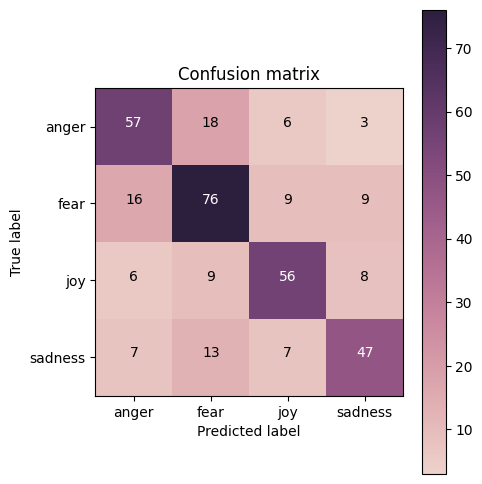

In [39]:
# plot your confusion matrix
my_tags = ['anger', 'fear', 'joy', 'sadness']
plot_confusion_matrix(cm, classes=my_tags, title='Confusion matrix')

---
### ** >>> Exercise 3 (Take home): **  
Can you interpret the results above? What do they mean?

In [40]:
# Answer here
# """
# The result shows that the main diagonal represents the number of correctly classified samples. 
# This indicates that the model's accuracy is high, and is highest for the "fear" category.
# And we can guess that the problem might appear in prediction of fear or sadness, fear's probability is highest and sadness' is the lowest.
# """

---
### ** >>> Exercise 4 (Take home): **  
Build a model using a ```Naive Bayes``` model and train it. What are the testing results? 

*Reference*: https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html

In [41]:
# Answer here
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# initialize Naive Bayes 
nb_model = MultinomialNB()

# train
nb_model.fit(X_train, y_train)

# predict on test
y_pred = nb_model.predict(X_test)

# evaluate
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.6974063400576369
Classification Report:
               precision    recall  f1-score   support

       anger       0.63      0.65      0.64        84
        fear       0.73      0.77      0.75       110
         joy       0.78      0.71      0.74        79
     sadness       0.64      0.62      0.63        74

    accuracy                           0.70       347
   macro avg       0.70      0.69      0.69       347
weighted avg       0.70      0.70      0.70       347



---
### ** >>> Exercise 5 (Take home): **  

How do the results from the Naive Bayes model and the Decision Tree model compare? How do you interpret these differences? Use the theoretical background covered in class to try and explain these differences.

In [42]:
# Answer here
# '''
# In terms of macro average and weighted average, Naive Bayes slightly outperforms Decision Tree, particularly in the F1-score.

# Theoretical Insights:
# Naive Bayes:
# Assumes that each feature's influence on the target variable is conditionally independent of the others. This simplifies computation and makes the model efficient.
# However, performance deteriorates when strong dependencies exist among features, such as in emotion classification with co-occurring synonyms.

# Decision Tree:
# Recursively partitions the data space by identifying features that maximize information gain, enabling it to capture nonlinear relationships.
# The model's weaknesses include sensitivity to outliers and a tendency to overfit.
# '''

---

## 5. Other things you can try

Thus, there are several things you can try that will affect your results. In order to yield better results, you can experiment by: 
- Trying different features (Feature engineering)e.g Word2Vec, PCA, LDA, FastText, Clustering
- Trying different models
- Analyzing your results and interpret them to improve your feature engineering/model building process
- Iterate through the steps above until finding a satisfying result

Remember that you should also consider the task at hand and the model you'll feed the data to. 

---
## 6. Deep Learning

We use [Keras](https://keras.io/) to be our deep learning framework, and follow the [Model (functional API)](https://keras.io/models/model/) to build a Deep Neural Network (DNN) model. Keras runs with Tensorflow in the backend. It's a nice abstraction to start working with NN models. 

Because Deep Learning is a 1-semester course, we can't talk about each detail about it in the lab session. Here, we only provide a simple template about how to build & run a DL model successfully. You can follow this template to design your model.

We will begin by building a fully connected network, which looks like this:

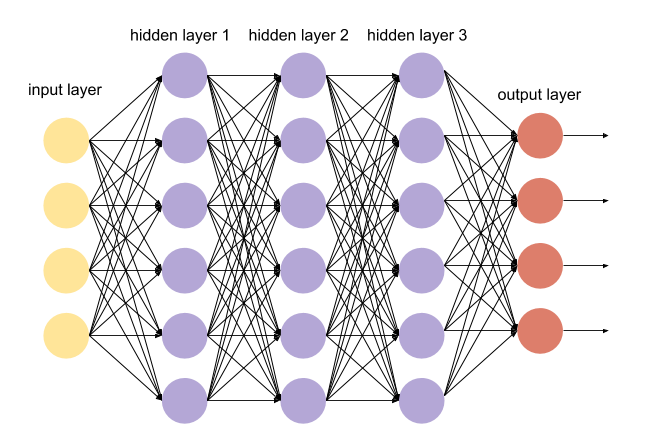

(source: https://github.com/drewnoff/spark-notebook-ml-labs/tree/master/labs/DLFramework)


### 6.1 Prepare data (X, y)

In [43]:
import keras

# standardize name (X, y) 
X_train = BOW_500.transform(train_df['text'])
y_train = train_df['emotion']

X_test = BOW_500.transform(test_df['text'])
y_test = test_df['emotion']

## check dimension is a good habbit 
print('X_train.shape: ', X_train.shape)
print('y_train.shape: ', y_train.shape)
print('X_test.shape: ', X_test.shape)
print('y_test.shape: ', y_test.shape)

X_train.shape:  (3613, 500)
y_train.shape:  (3613,)
X_test.shape:  (347, 500)
y_test.shape:  (347,)


In [44]:
import keras

In [45]:
BOW_500.transform(test_df['text'])

<347x500 sparse matrix of type '<class 'numpy.int64'>'
	with 4103 stored elements in Compressed Sparse Row format>

### 6.2 Deal with categorical label (y)

Rather than put your label `train_df['emotion']` directly into a model, we have to process these categorical (or say nominal) label by ourselves. 

Here, we use the basic method [one-hot encoding](https://en.wikipedia.org/wiki/One-hot) to transform our categorical  labels to numerical ones.


In [46]:
## deal with label (string -> one-hot)

from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
label_encoder.fit(y_train)
print('check label: ', label_encoder.classes_)
print('\n## Before convert')
print('y_train[0:4]:\n', y_train[0:4])
print('\ny_train.shape: ', y_train.shape)
print('y_test.shape: ', y_test.shape)

def label_encode(le, labels):
    enc = le.transform(labels)
    return keras.utils.to_categorical(enc)

def label_decode(le, one_hot_label):
    dec = np.argmax(one_hot_label, axis=1)
    return le.inverse_transform(dec)

y_train = label_encode(label_encoder, y_train)
y_test = label_encode(label_encoder, y_test)

print('\n\n## After convert')
print('y_train[0:4]:\n', y_train[0:4])
print('\ny_train.shape: ', y_train.shape)
print('y_test.shape: ', y_test.shape)


check label:  ['anger' 'fear' 'joy' 'sadness']

## Before convert
y_train[0:4]:
 3609    sadness
3306    sadness
894        fear
3026    sadness
Name: emotion, dtype: object

y_train.shape:  (3613,)
y_test.shape:  (347,)


## After convert
y_train[0:4]:
 [[0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]]

y_train.shape:  (3613, 4)
y_test.shape:  (347, 4)


### 6.3 Build model

In [47]:
# I/O check
input_shape = X_train.shape[1]
print('input_shape: ', input_shape)

output_shape = len(label_encoder.classes_)
print('output_shape: ', output_shape)

input_shape:  500
output_shape:  4


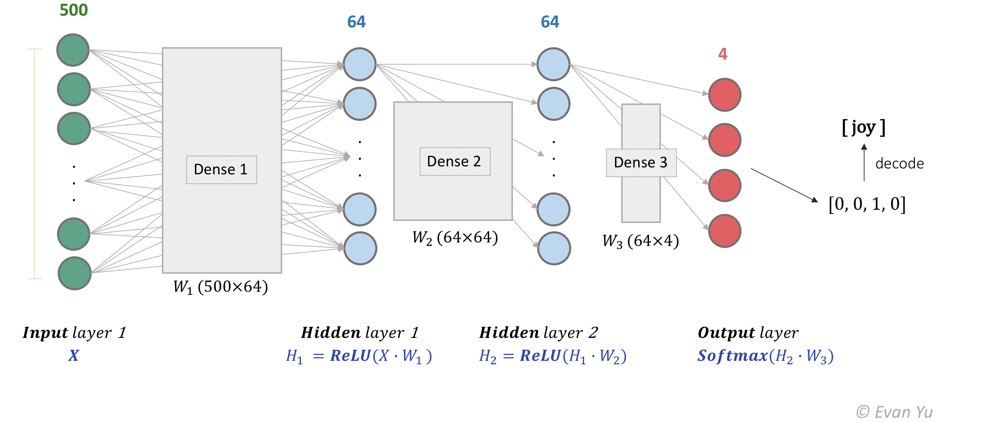

In [48]:
from keras.models import Model
from keras.layers import Input, Dense
from keras.layers import ReLU, Softmax

# input layer
model_input = Input(shape=(input_shape, ))  # 500
X = model_input

# 1st hidden layer
X_W1 = Dense(units=64)(X)  # 64
H1 = ReLU()(X_W1)

# 2nd hidden layer
H1_W2 = Dense(units=64)(H1)  # 64
H2 = ReLU()(H1_W2)

# output layer
H2_W3 = Dense(units=output_shape)(H2)  # 4
H3 = Softmax()(H2_W3)

model_output = H3

# create model
model = Model(inputs=[model_input], outputs=[model_output])

# loss function & optimizer
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# show model construction
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 500)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │          32,064 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu (ReLU)                         │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_1 (ReLU)                       │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 4)                   │             260 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ softmax (Softmax)                    │ (None, 4)                   │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 36,484 (142.52 KB)

 Trainable params: 36,484 (142.52 KB)

 Non-trainable params: 0 (0.00 B)

### 6.4 Train

In [49]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('logs/training_log.csv')

# training setting
epochs = 25
batch_size = 32

# training!
history = model.fit(X_train, y_train, 
                    epochs=epochs, 
                    batch_size=batch_size, 
                    callbacks=[csv_logger],
                    validation_data = (X_test, y_test))
print('training finish')

Epoch 1/25


C:\Users\willy\anaconda3\envs\DataMining\lib\site-packages\keras\src\models\functional.py:225: UserWarning:

The structure of `inputs` doesn't match the expected structure: ['keras_tensor']. Received: the structure of inputs=*



113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3245 - loss: 1.3594 - val_accuracy: 0.4207 - val_loss: 1.2753
Epoch 2/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6067 - loss: 1.0796 - val_accuracy: 0.6715 - val_loss: 0.9146
Epoch 3/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8021 - loss: 0.6057 - val_accuracy: 0.7032 - val_loss: 0.7481
Epoch 4/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8598 - loss: 0.3997 - val_accuracy: 0.7061 - val_loss: 0.7748
Epoch 5/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8887 - loss: 0.3209 - val_accuracy: 0.7032 - val_loss: 0.7935
Epoch 6/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9145 - loss: 0.2564 - val_accuracy: 0.6744 - val_loss: 0.8699
Epoch 7/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9287 - loss: 0.2176 - val_accuracy: 0.6830 - val_loss: 0.9272
Epoch 8/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9412 - loss: 0.1782 - val_accuracy: 0.6830 - val_

### 6.5 Predict on testing data

In [50]:
## predict
pred_result = model.predict(X_test, batch_size=128)
pred_result[:5]

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step 


array([[3.4909961e-06, 9.9998796e-01, 1.2578396e-09, 8.5590727e-06],
       [3.4544955e-05, 9.9995291e-01, 7.0550409e-06, 5.4951115e-06],
       [9.9996686e-01, 1.2587989e-06, 5.5637634e-07, 3.1250896e-05],
       [2.1341702e-05, 9.9904770e-01, 1.1596374e-04, 8.1499963e-04],
       [6.7016184e-11, 9.9999762e-01, 2.3248465e-06, 3.8550612e-09]],
      dtype=float32)

In [51]:
pred_result = label_decode(label_encoder, pred_result)
pred_result[:5]

array(['fear', 'fear', 'anger', 'fear', 'fear'], dtype=object)

In [52]:
from sklearn.metrics import accuracy_score

print('testing accuracy: {}'.format(round(accuracy_score(label_decode(label_encoder, y_test), pred_result), 2)))

testing accuracy: 0.67


In [53]:
#Let's take a look at the training log
training_log = pd.DataFrame()
training_log = pd.read_csv("logs/training_log.csv")
training_log

,epoch,accuracy,loss,val_accuracy,val_loss
0,0,0.367562,1.327538,0.420749,1.275319
1,1,0.650983,0.986261,0.671470,0.914591
2,2,0.794631,0.576531,0.703170,0.748086
3,3,0.845558,0.416126,0.706052,0.774795
4,4,0.886244,0.326617,0.703170,0.793473
5,5,0.906172,0.271451,0.674352,0.869945
6,6,0.925270,0.220223,0.682997,0.927214
7,7,0.937171,0.187684,0.682997,0.969699
8,8,0.948796,0.160997,0.691643,1.008657
9,9,0.960421,0.138588,0.680115,1.050328


---
### ** >>> Exercise 6 (Take home): **  

Plot the Training and Validation Accuracy and Loss (different plots), just like the images below.(Note: the pictures below are an example from a different model). How to interpret the graphs you got? How are they related to the concept of overfitting/underfitting covered in class?

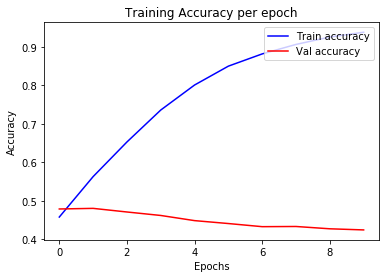


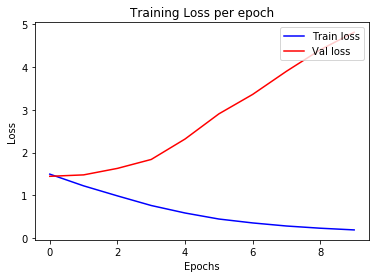

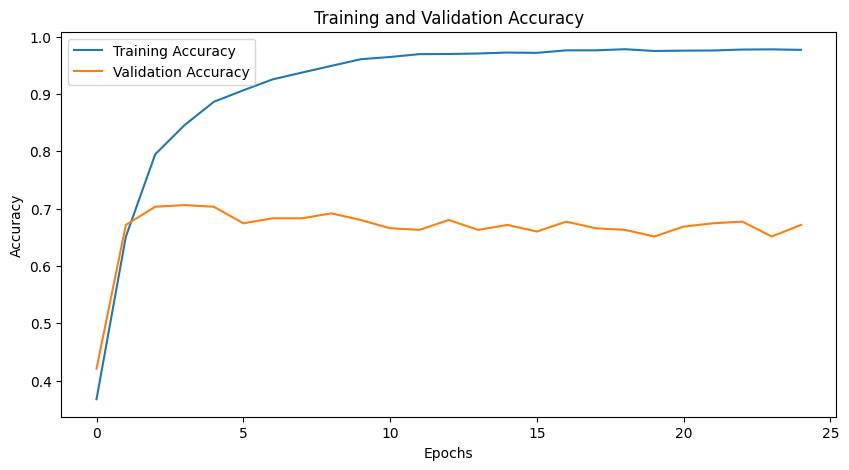

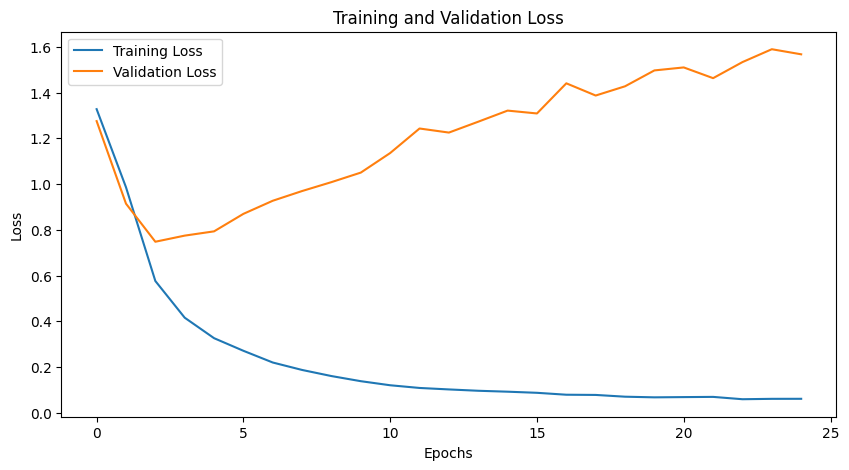

In [54]:
# Answer here
import matplotlib.pyplot as plt

# plot training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(training_log['accuracy'], label='Training Accuracy')
plt.plot(training_log['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# plot Training and Validation Loss
plt.figure(figsize=(10, 5))
plt.plot(training_log['loss'], label='Training Loss')
plt.plot(training_log['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


---

### Note

If you don't have a GPU (level is higher than GTX 1060) or you are not good at setting lots of things about computer, we recommend you to use the [kaggle kernel](https://www.kaggle.com/kernels) to do deep learning model training. They have already installed all the librarys and provided free GPU for you to use.

Note however that you will only be able to run a kernel for 6 hours. After 6 hours of inactivity, your Kaggle kernel will shut down (meaning if your model takes more than 6 hours to train, you can't train it at once).


### More Information for your reference

* Keras document: https://keras.io/
* Keras GitHub example: https://github.com/keras-team/keras/tree/master/examples
* CS229: Machine Learning: http://cs229.stanford.edu/syllabus.html
* Deep Learning cheatsheet: https://stanford.edu/~shervine/teaching/cs-229/cheatsheet-deep-learning
* If you want to try TensorFlow or PyTorch: https://pytorch.org/tutorials/
https://www.tensorflow.org/tutorials/quickstart/beginner

---
## 7. Word2Vector

We will introduce how to use `gensim` to train your word2vec model and how to load a pre-trained model.

https://radimrehurek.com/gensim/index.html

### 7.1 Prepare training corpus

In [55]:
## check library
import gensim

## ignore warnings
import warnings
warnings.filterwarnings('ignore')

# # if you want to see the training messages, you can use it
# import logging
# logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

## the input type
train_df['text_tokenized'] = train_df['text'].apply(lambda x: nltk.word_tokenize(x))
train_df[['id', 'text', 'text_tokenized']].head()

,id,text,text_tokenized
3609,40782,Just put the winter duvet on ☃️❄️🌬☔️,"[Just, put, the, winter, duvet, on, ☃️❄️🌬☔️]"
3306,40479,The Sunderland time line is quite funny with a...,"[The, Sunderland, time, line, is, quite, funny..."
894,20037,@officialShaky 'Operation Echoes' is gathering...,"[@, officialShaky, 'Operation, Echoes, ', is, ..."
3026,40199,My friends tell me I'm pretty. Trigger tells m...,"[My, friends, tell, me, I, 'm, pretty, ., Trig..."
1697,20840,Let's refuse to live in #fear - #c$%t,"[Let, 's, refuse, to, live, in, #, fear, -, #,..."


In [56]:
## create the training corpus
training_corpus = train_df['text_tokenized'].values
training_corpus[:3]

array([list(['Just', 'put', 'the', 'winter', 'duvet', 'on', '☃️❄️🌬☔️']),
       list(['The', 'Sunderland', 'time', 'line', 'is', 'quite', 'funny', 'with', 'all', 'the', 'doom', '&', 'amp', ';', 'gloom', 'in', 'facing', 'us', 'and', 'the', 'long', 'trip', 'to', 'us', 'midweek', '.', '#', 'whatgoesaroundcomesaround']),
       list(['@', 'officialShaky', "'Operation", 'Echoes', "'", 'is', 'gathering', 'momentum', '...', '#', 'tense', '#', 'nervous', '#', 'feelsick', '#', 'excited'])],
      dtype=object)

### 7.2 Training our model

You can try to train your own model. More details: https://radimrehurek.com/gensim/models/word2vec.html

In [57]:
from gensim.models import Word2Vec

## setting
vector_dim = 100
window_size = 5
min_count = 1
training_epochs = 20

## model
word2vec_model = Word2Vec(sentences=training_corpus, 
                          vector_size=vector_dim, window=window_size, 
                          min_count=min_count, epochs=training_epochs)

![Imgur](https://i.imgur.com/Fca3MCs.png)

### 7.3 Generating word vector (embeddings)

In [58]:
# get the corresponding vector of a word
word_vec = word2vec_model.wv['happy']
word_vec

array([ 0.36947352,  0.42964825, -0.35021633, -0.2623962 ,  0.13472526,
       -1.3795052 ,  0.28904736,  2.0078144 , -0.42039597, -0.60611004,
       -0.41276765, -0.55842394, -0.08550708,  0.25346357, -0.21348332,
       -0.48641247,  0.38384256, -0.05469538,  0.4753101 , -1.0823822 ,
        0.354508  ,  0.6027589 ,  0.601784  , -0.16207302, -0.20865524,
       -0.08552367, -0.15848134,  0.74268085, -0.40759447, -0.01880634,
        0.5250316 , -0.10984433,  0.40358046, -0.6629096 , -0.15421812,
        0.73165476,  0.2587593 ,  0.06154609, -0.2147048 , -0.58804446,
        0.12036993,  0.15087584, -0.00278949,  0.5305967 ,  0.4751431 ,
       -0.08691639, -0.64427537, -0.02862909,  0.28051317,  0.23150873,
       -0.2768068 , -0.39500237, -0.13174269, -0.05135643, -0.45542166,
       -0.38641223,  0.3869307 , -0.5646273 , -0.21706963, -0.25642806,
        0.29509997,  0.05146061,  0.2157134 , -0.17081042, -0.6770254 ,
        0.6694968 ,  0.56647736,  0.87534   , -1.5597944 ,  0.44

In [59]:
# Get the most similar words
word = 'happy'
topn = 10
word2vec_model.wv.most_similar(word, topn=topn)

[('Be', 0.9397779703140259),
 ('blessed', 0.9350343942642212),
 ('free', 0.9214385747909546),
 ('forever', 0.9207265973091125),
 ('birthday', 0.9171144962310791),
 ('bday', 0.9142405390739441),
 ('smile', 0.9135169386863708),
 ('nervouswreck', 0.9072483777999878),
 ('cats', 0.905318021774292),
 ("'you", 0.9013497829437256)]

### 7.4 Using a pre-trained w2v model

Instead of training your own model ,you can use a model that has already been trained. Here, we see 2 ways of doing that:


#### (1) Download model by yourself

source: [GoogleNews-vectors-negative300](https://code.google.com/archive/p/word2vec/)

more details: https://radimrehurek.com/gensim/models/keyedvectors.html

In [60]:
from gensim.models import KeyedVectors

## Note: this model is very huge, this will take some time ...
model_path = "GoogleNews/GoogleNews-vectors-negative300.bin"
w2v_google_model = KeyedVectors.load_word2vec_format(model_path, binary=True)
print('load ok')

w2v_google_model.most_similar('happy', topn=10)

load ok


[('glad', 0.7408890724182129),
 ('pleased', 0.6632170677185059),
 ('ecstatic', 0.6626912355422974),
 ('overjoyed', 0.6599286794662476),
 ('thrilled', 0.6514049172401428),
 ('satisfied', 0.6437949538230896),
 ('proud', 0.636042058467865),
 ('delighted', 0.627237856388092),
 ('disappointed', 0.6269949674606323),
 ('excited', 0.6247665286064148)]

#### (2) Using gensim api

Other pretrained models are available here: https://github.com/RaRe-Technologies/gensim-data

In [61]:
import gensim.downloader as api

## If you see `SSL: CERTIFICATE_VERIFY_FAILED` error, use this:
import ssl
import urllib.request
ssl._create_default_https_context = ssl._create_unverified_context

glove_twitter_25_model = api.load("glove-twitter-25")
print('load ok')

glove_twitter_25_model.most_similar('happy', topn=10)

load ok


[('birthday', 0.9577818512916565),
 ('thank', 0.937666654586792),
 ('welcome', 0.93361496925354),
 ('love', 0.9176183342933655),
 ('miss', 0.9164500832557678),
 ('hello', 0.9158351421356201),
 ('thanks', 0.915008544921875),
 ('merry', 0.9053249359130859),
 ('bless', 0.902732253074646),
 ('wish', 0.9013164043426514)]

### 7.5 king + woman - man = ?

Let's run one of the most famous examples for Word2Vec and compute the similarity between these 3 words:

In [62]:
w2v_google_model.most_similar(positive=['king', 'woman'], negative=['man'])

[('queen', 0.7118193507194519),
 ('monarch', 0.6189674139022827),
 ('princess', 0.5902431011199951),
 ('crown_prince', 0.5499460697174072),
 ('prince', 0.5377321839332581),
 ('kings', 0.5236844420433044),
 ('Queen_Consort', 0.5235945582389832),
 ('queens', 0.5181134343147278),
 ('sultan', 0.5098593831062317),
 ('monarchy', 0.5087411999702454)]

---
### ** >>> Exercise 7 (Take home): **  

Now, we have the word vectors, but our input data is a sequence of words (or say sentence). 
How can we utilize these "word" vectors to represent the sentence data and train our model?


In [63]:
# Answer here
# 1. use weights (e.g., TF-IDF scores) to emphasize important words in the sentence
# 2. concatenate the vectors of words in the sentence to form a sequence input

## 8. Clustering: k-means

Here we introduce how to use `sklearn` to do the basic **unsupervised learning** approach, k-means.    

more details: http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html


#### Basic concept

![Image](https://i.imgur.com/PEdUf54.png)

(img source: https://towardsdatascience.com/k-means-clustering-identifying-f-r-i-e-n-d-s-in-the-world-of-strangers-695537505d)

In [64]:
# clustering target
target_list = ['happy', 'fear', 'angry', 'car', 'teacher', 'computer']
print('target words: ', target_list)

# convert to word vector
X = [word2vec_model.wv[word] for word in target_list]

target words:  ['happy', 'fear', 'angry', 'car', 'teacher', 'computer']


In [65]:
from sklearn.cluster import KMeans

# we have to decide how many cluster (k) we want
k = 2

# k-means model
kmeans_model = KMeans(n_clusters=k)
kmeans_model.fit(X)

# cluster result
cluster_result = kmeans_model.labels_

# show
for i in range(len(target_list)):
    print('word: {} \t cluster: {}'.format(target_list[i], cluster_result[i]))

word: happy 	 cluster: 1
word: fear 	 cluster: 0
word: angry 	 cluster: 0
word: car 	 cluster: 0
word: teacher 	 cluster: 0
word: computer 	 cluster: 0


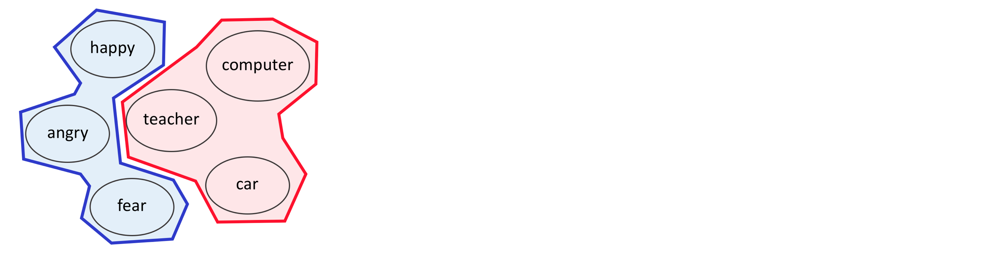

In [66]:
#check cluster membership
word = 'student'
word_vec = word2vec_model.wv[word]
kmeans_model.predict([word_vec])

array([0])

In [67]:
#check cluster membership
word = 'sad'
word_vec = word2vec_model.wv[word]
kmeans_model.predict([word_vec])

array([0])


## 9. High-dimension Visualization: t-SNE and UMAP

No matter if you use the Bag-of-words, TF-IDF, or Word2Vec, it's very hard to see the embedding result, because the dimension is larger than 3.  

In Lab 1, we already talked about PCA, t-SNE and UMAP. We can use PCA to reduce the dimension of our data, then visualize it. However, if you dig deeper into the result, you'd find it is insufficient.

Our aim will be to create a visualization similar to the one below with t-SNE:

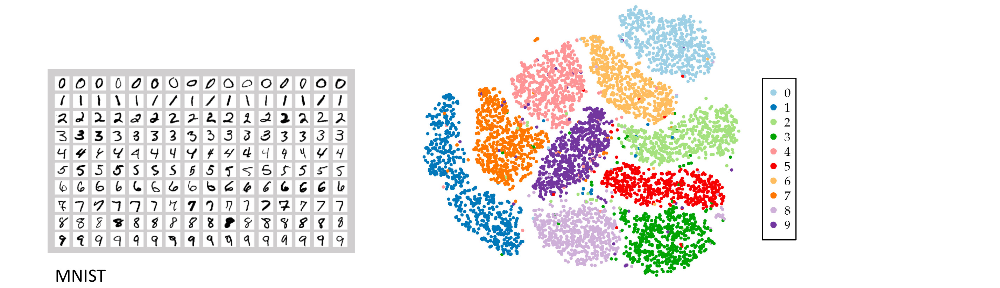

source: https://www.fabian-keller.de/research/high-dimensional-data-visualization 

And also like this for UMAP:
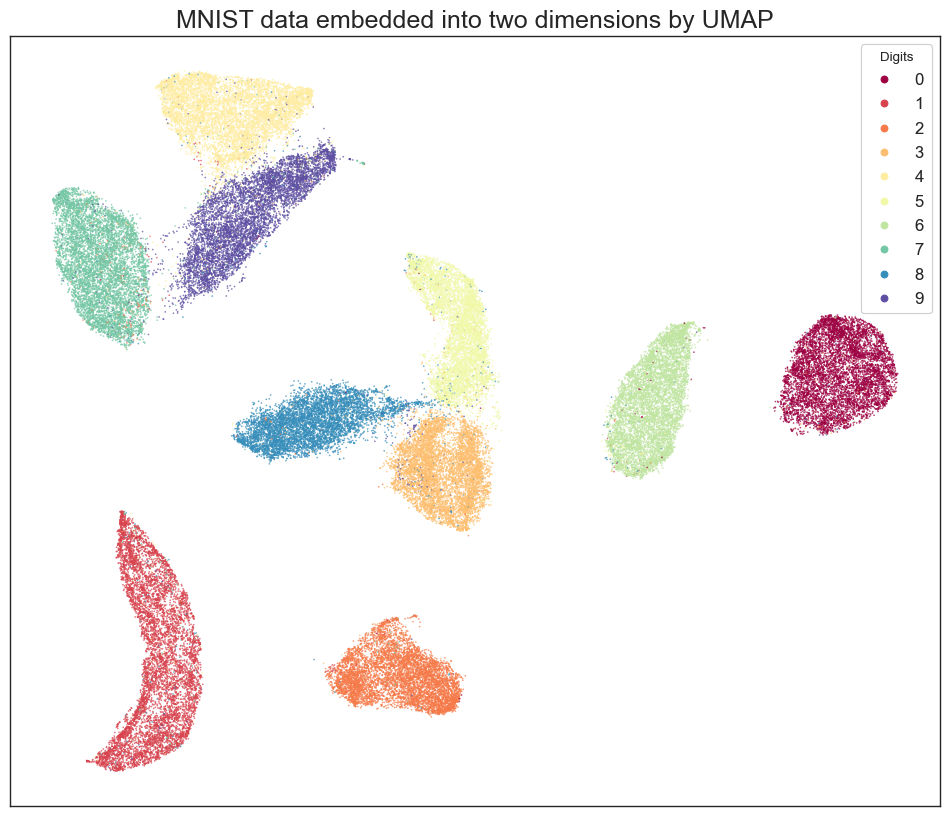

source: https://umap-learn.readthedocs.io/en/latest/auto_examples/plot_mnist_example.html

t-SNE and UMAP reference:  
http://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html 
https://umap-learn.readthedocs.io/en/latest/

### 9.1 Prepare visualizing target

Let's prepare data lists like:
- happy words
- angry words
- data words
- mining words

In [68]:
word_list = ['happy', 'angry', 'data', 'mining']

topn = 5
happy_words = ['happy'] + [word_ for word_, sim_ in w2v_google_model.most_similar('happy', topn=topn)]
angry_words = ['angry'] + [word_ for word_, sim_ in w2v_google_model.most_similar('angry', topn=topn)]        
data_words = ['data'] + [word_ for word_, sim_ in w2v_google_model.most_similar('data', topn=topn)]        
mining_words = ['mining'] + [word_ for word_, sim_ in w2v_google_model.most_similar('mining', topn=topn)]        

print('happy_words: ', happy_words)
print('angry_words: ', angry_words)
print('data_words: ', data_words)
print('mining_words: ', mining_words)

target_words = happy_words + angry_words + data_words + mining_words
print('\ntarget words: ')
print(target_words)

print('\ncolor list:')
cn = topn + 1
color = ['b'] * cn + ['g'] * cn + ['r'] * cn + ['y'] * cn
print(color)

happy_words:  ['happy', 'glad', 'pleased', 'ecstatic', 'overjoyed', 'thrilled']
angry_words:  ['angry', 'irate', 'enraged', 'indignant', 'incensed', 'annoyed']
data_words:  ['data', 'Data', 'datasets', 'dataset', 'databases', 'statistics']
mining_words:  ['mining', 'Mining', 'mines', 'coal_mining', 'mine', 'miner']

target words: 
['happy', 'glad', 'pleased', 'ecstatic', 'overjoyed', 'thrilled', 'angry', 'irate', 'enraged', 'indignant', 'incensed', 'annoyed', 'data', 'Data', 'datasets', 'dataset', 'databases', 'statistics', 'mining', 'Mining', 'mines', 'coal_mining', 'mine', 'miner']

color list:
['b', 'b', 'b', 'b', 'b', 'b', 'g', 'g', 'g', 'g', 'g', 'g', 'r', 'r', 'r', 'r', 'r', 'r', 'y', 'y', 'y', 'y', 'y', 'y']


### 9.2 Plot using t-SNE and UMAP (2-dimension)

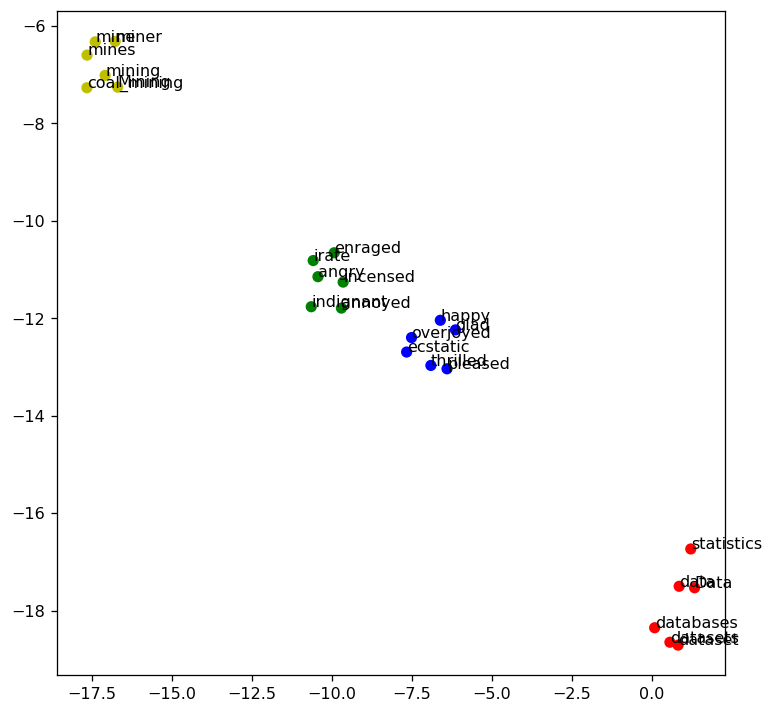

In [69]:
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

## w2v model
model = w2v_google_model

## prepare training word vectors
size = 200
target_size = len(target_words)
all_word = list(model.index_to_key)
word_train = target_words + all_word[:size]
X_train = model[word_train]

## t-SNE model
tsne = TSNE(n_components=2, metric='cosine', random_state=28)

## training
X_tsne = tsne.fit_transform(X_train)

## plot the result
plt.figure(figsize=(7.5, 7.5), dpi=115)
plt.scatter(X_tsne[:target_size, 0], X_tsne[:target_size, 1], c=color)
for label, x, y in zip(target_words, X_tsne[:target_size, 0], X_tsne[:target_size, 1]):
    plt.annotate(label, xy=(x,y), xytext=(0,0),  textcoords='offset points')
plt.show()

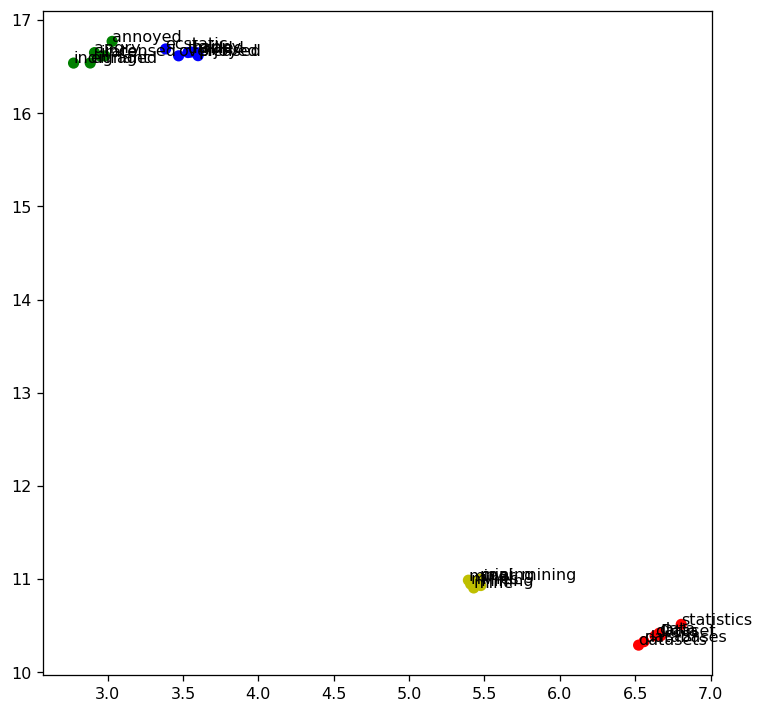

In [70]:
import matplotlib.pyplot as plt
import umap.umap_ as umap

## w2v model
model = w2v_google_model

## prepare training word vectors
size = 200
target_size = len(target_words)
all_word = list(model.index_to_key)
word_train = target_words + all_word[:size]
X_train = model[word_train]

## UMAP model
umap_model = umap.UMAP(n_components=2, metric='cosine', random_state=28)

## training
X_umap = umap_model.fit_transform(X_train)

## plot the result
plt.figure(figsize=(7.5, 7.5), dpi=115)
plt.scatter(X_umap[:target_size, 0], X_umap[:target_size, 1], c=color)
for label, x, y in zip(target_words, X_umap[:target_size, 0], X_umap[:target_size, 1]):
    plt.annotate(label, xy=(x,y), xytext=(0,0),  textcoords='offset points')
plt.show()



### ** >>> Exercise 8 (Take home): **  

Generate a t-SNE and UMAP visualization to show the 15 words most related to the words "angry", "happy", "sad", "fear" (60 words total). Compare the differences between both graphs.


Target words:
['angry', 'irate', 'enraged', 'indignant', 'incensed', 'annoyed', 'agitated', 'frustrated', 'furious', 'unhappy', 'outraged', 'livid', 'irritated', 'exasperated', 'angrier', 'Angry', 'happy', 'glad', 'pleased', 'ecstatic', 'overjoyed', 'thrilled', 'satisfied', 'proud', 'delighted', 'disappointed', 'excited', 'happier', 'Said_Hirschbeck', 'elated', 'thankful', 'unhappy', 'sad', 'saddening', 'Sad', 'saddened', 'heartbreaking', 'disheartening', 'Meny_Friedman', 'parishioner_Pat_Patello', 'saddens_me', 'distressing', 'reminders_bobbing', 'Turkoman_Shiites', 'saddest', 'unfortunate', 'sorry', 'bittersweet', 'fear', 'fearful', 'fears', 'Fear', 'fearing', 'worry', 'dread', 'feared', 'anxiety', 'apprehension', 'afraid', 'worries', 'concern', 'distrust', 'worried', 'Fearful']


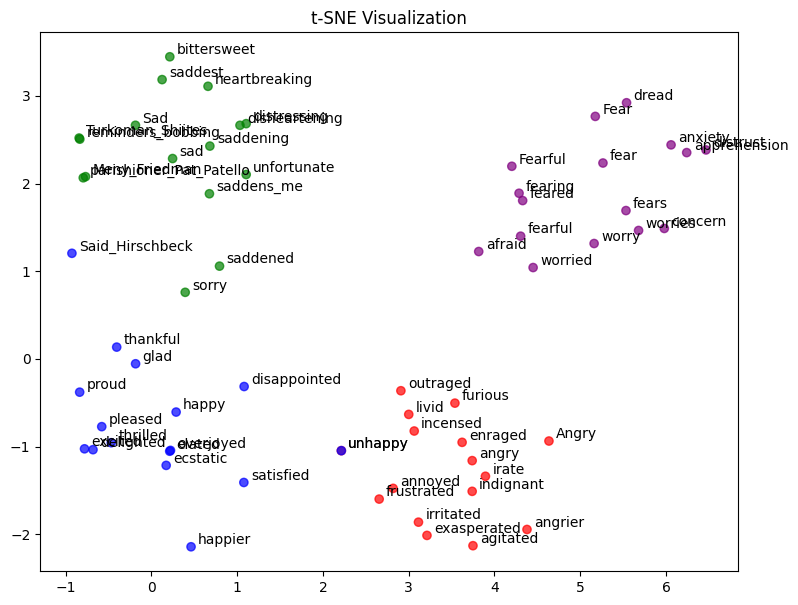

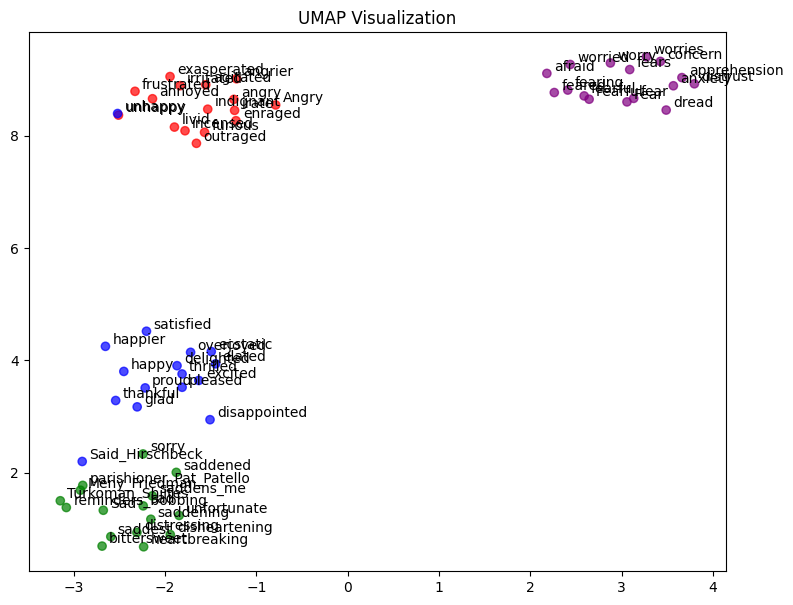

Umap can better tell the difference between moods, t-SNE can easily watch individual items.


In [71]:
# Answer here
import matplotlib.pyplot as plt
import umap.umap_ as umap
from sklearn.manifold import TSNE
import numpy as np


model = w2v_google_model 

# 15 words most related
topn = 15

emotion_words = {}
colors = []
color_map = {"angry": "red", "happy": "blue", "sad": "green", "fear": "purple"}

for emotion in ["angry", "happy", "sad", "fear"]:
    similar_words = [emotion] + [word for word, sim in model.most_similar(emotion, topn=topn)]
    emotion_words[emotion] = similar_words
    colors.extend([color_map[emotion]] * (topn + 1))  # core words included

# combine words
target_words = []
for words in emotion_words.values():
    target_words.extend(words)


print('\nTarget words:')
print(target_words)

word_vectors = []
valid_words = []
valid_colors = []

for word, color in zip(target_words, colors):
    if word in model.key_to_index:  # make sure the words in the model
        word_vectors.append(model[word])
        valid_words.append(word)
        valid_colors.append(color)

# transfer to array
word_vectors = np.array(word_vectors)

# t-SNE 
tsne_model = TSNE(n_components=2, metric="cosine", random_state=28)
X_tsne = tsne_model.fit_transform(word_vectors)

plt.figure(figsize=(9, 7))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=valid_colors, alpha=0.7)
for label, x, y in zip(valid_words, X_tsne[:, 0], X_tsne[:, 1]):
    plt.annotate(label, xy=(x, y), xytext=(5, 2), textcoords="offset points")
plt.title("t-SNE Visualization")
plt.show()

# UMAP 
umap_model = umap.UMAP(n_components=2, metric="cosine", random_state=28)
X_umap = umap_model.fit_transform(word_vectors)

plt.figure(figsize=(9, 7))
plt.scatter(X_umap[:, 0], X_umap[:, 1], c=valid_colors, alpha=0.7)
for label, x, y in zip(valid_words, X_umap[:, 0], X_umap[:, 1]):
    plt.annotate(label, xy=(x, y), xytext=(5, 2), textcoords="offset points")
plt.title("UMAP Visualization")
plt.show()

print("Umap can better tell the difference between moods, t-SNE can easily watch individual items.")

## 10. Large Language Models (LLMs)
Large Language Models (LLMs) are AI models trained on vast text data to understand and generate human language. Models like GPT and BERT excel at tasks like translation, summarization, and sentiment analysis due to their deep learning techniques and large-scale training. Recently these models got popular with the rise of Open-AI's ChatGPT and their different models, showcasing the potential of these models in a lot of aspects of our current society.

Open-source LLMs are cost-effective and customizable, with strong community support, but may underperform compared to paid models and require technical expertise to manage. Paid LLMs offer superior performance, ease of use, and regular updates, but are costly, less flexible, and create dependency on external providers for ongoing access and updates.

#### Open Source LLMs: 
In this lab we are going to use Ollama ([Ollama GitHub Link](https://github.com/ollama/ollama)), that is a library that let us use a long list of open-source LLMs of differing size. For this section we are going to be using **'llama3.2'** or **'llama3.2:1b'** for **text based tasks**, and **'llava-phi3'** for **multi-modal tasks** (e.g. image to text). Ollama has a great variety of models, and those can be found here: [model library](https://ollama.com/library). You are free to explore them if you want to try using them, you can check the advantages and disadvantages of each.

Or they can also be observed in here:
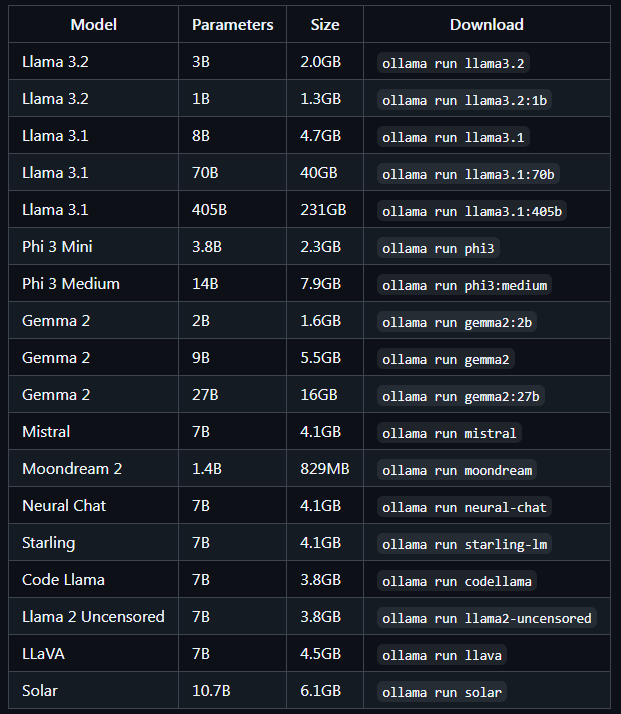

In the previous image we can observe that all LLMs have something called parameters, these are the internal weights that the model learns during training, helping it understand and generate language. The more a model has, the more complex and accurate it can be, but it also needs more memory to run.

For example:

Models with **7 billion parameters** need at least **8 GB of VRAM**.
**13 billion parameters** require **16 GB of VRAM**.
**33 billion parameters** need **32 GB of VRAM**.
The higher the number of parameters, the more memory and computational power the model needs to function efficiently.

And so that is why we are trying to use small LLMs for this practice, because they require a lot of computational resources, so by using 'llama3.2' and 'llava-phi3', both models with 3 billion parameters, we will only use at most 8 GB of VRAM. But if there are some issues with 'llama3.2' we can still use 'llama3.2:1b' the model with 1 billion parameters that requires less resources.

So now let's talk about the models: 
**LLaMA 3.2** is part of the LLaMA series (Large Language Model Meta AI), designed to provide efficient language understanding and generation. Despite having fewer parameters than some larger models, it offers strong performance in NLP tasks, making it suitable for scenarios where both accuracy and resource efficiency are important.

**LLaVA** (Large Language and Vision Assistant) models, like **LLaVA-Phi3** are multimodal models combining language and vision capabilities. It can interpret visual inputs like images and generate corresponding text, making it ideal for tasks that require both visual understanding and language generation, such as image captioning and answering visual-based questions.

**I will be using the llama3.2 model going onwards, you can change it for the smallest version if it is necessary for you, or you can try to run it on Kaggle where you can use online GPU resources for it.**

### 10.1 Text Prompting
Like with ChatGPT we can use these models to ask about anything. Here we are going to ask a question and then ask it to return it in markdown format to make it look better afterwards.

In [72]:
import ollama
response = ollama.chat(model='llama3.2', messages=[
    {
        'role': 'user',
        'content': 'What is data mining? (in markdown format)'
    },
])

print(response['message']['content'])

**Data Mining**

### Definition

Data mining is the process of automatically discovering patterns, relationships, and insights from large datasets. It involves using various techniques and algorithms to analyze and extract valuable information from raw data.

### Types of Data Mining

#### 1. **Supervised Learning**

In supervised learning, the algorithm learns from labeled data (e.g., images with labels) to make predictions or classify new data points.

#### 2. **Unsupervised Learning**

In unsupervised learning, the algorithm discovers patterns and relationships without any prior knowledge of the data (e.g., clustering customers based on their buying behavior).

#### 3. **Reinforcement Learning**

In reinforcement learning, the algorithm learns by interacting with an environment and receiving feedback in the form of rewards or penalties.

### Data Mining Techniques

*   **Association Rule Mining**: Identifies relationships between products purchased together.
*   **Clustering**: Grou

**We can use the IPython library to make the response look better:**

In [73]:
from IPython.display import display, Markdown, Latex
display(Markdown('*some markdown* $\phi$'))

*some markdown* $\phi$

In [74]:
display(Markdown(response['message']['content']))

**Data Mining**
================

### Definition

Data mining is the process of automatically discovering patterns, relationships, and insights from large datasets. It involves using various techniques and algorithms to analyze and extract valuable information from raw data.

### Types of Data Mining

#### 1. **Supervised Learning**

In supervised learning, the algorithm learns from labeled data (e.g., images with labels) to make predictions or classify new data points.

#### 2. **Unsupervised Learning**

In unsupervised learning, the algorithm discovers patterns and relationships without any prior knowledge of the data (e.g., clustering customers based on their buying behavior).

#### 3. **Reinforcement Learning**

In reinforcement learning, the algorithm learns by interacting with an environment and receiving feedback in the form of rewards or penalties.

### Data Mining Techniques

*   **Association Rule Mining**: Identifies relationships between products purchased together.
*   **Clustering**: Groups similar data points together based on their attributes.
*   **Classification**: Predicts a categorical outcome (e.g., spam vs. non-spam email).
*   **Regression**: Predicts a continuous outcome (e.g., predicting house prices).

### Benefits of Data Mining

*   **Improved Decision Making**: Extract insights from large datasets to inform business decisions.
*   **Increased Efficiency**: Automates routine tasks and reduces manual effort.
*   **Enhanced Customer Experience**: Personalized recommendations and targeted marketing campaigns.

### Challenges in Data Mining

*   **Data Quality Issues**: Inaccurate or missing data can lead to biased results.
*   **Scalability**: Handling large datasets requires efficient algorithms and hardware.
*   **Interpretability**: Understanding complex models and results can be challenging.


### ** >>> Exercise 9 (Take home): **  

You noticed there is a **role** parameter inside the ollama.chat function, investigate what other roles there can be inside the function and what do they do. Give an example of a prompt using another role in additional to the **user** one.

In [75]:
# Answer here
'''In ollama.chat, the role parameter is used to specify the role of the message. 
Besides the commonly used user role, there are other roles available, as follows:

system: Provides system-level instructions or settings, typically used to define the context or rules for the conversation.
assistant: Represents the responses from the AI assistant.
user: Represents the input from the user.'''

'In ollama.chat, the role parameter is used to specify the role of the message. \nBesides the commonly used user role, there are other roles available, as follows:\n\nsystem: Provides system-level instructions or settings, typically used to define the context or rules for the conversation.\nassistant: Represents the responses from the AI assistant.\nuser: Represents the input from the user.'

### 10.2 Multi-Modal Prompting - Text + Images
Multi-modal prompting involves using input from multiple sources or modes, such as text, images, or audio, to guide a model's response. It allows AI to process and generate information based on more than one type of input.

For image plus text prompting, the model receives both an image and a related text prompt. The image provides visual context, while the text gives additional guidance. The model uses both inputs to generate more accurate and contextually relevant responses, which is useful for tasks like image captioning, visual question answering, or content generation based on visual cues.

Let's look at the following images that are in the **pics** folder in the directory of this notebook:

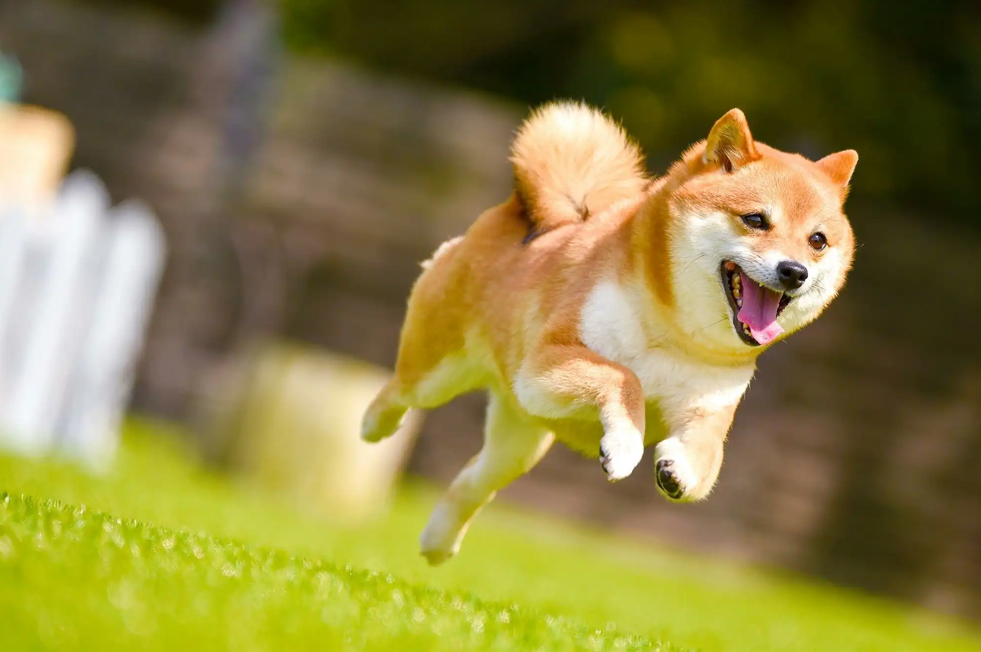
source: https://cooljapan-videos.com/tw/articles/epe0y86g

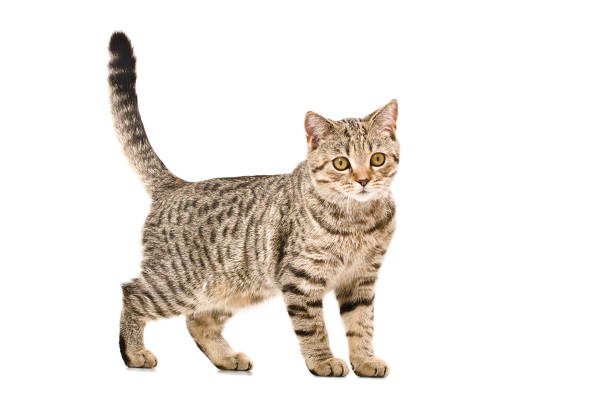
source: https://www.istockphoto.com/photo/young-cat-scottish-straight-gm1098182434-294927481

We will use the **llava-phi3** model that we installed to request a description of the images:

In [76]:
import ollama
response2 = ollama.chat(model='llava-phi3', messages=[
    {
        'role': 'user',
        'content': 'What is this image about?',
        'images': ['./pics/example1.png'] #Image with the dog
    },
])

display(Markdown(response2['message']['content']))

In the heart of a lush, green lawn under a clear blue sky, a Shiba Inu dog is caught in a moment of pure joy and freedom. The dog, with its vibrant orange fur contrasting against the verdant grass, is captured mid-air, front paws reaching for the sky as if embracing the world around it. Its tail stands high in the air, adding to the sense of exuberance. A blurred tree trunk in the background suggests a park or garden setting, providing a serene backdrop to this playful scene. The dog's eyes are wide and its mouth is open, as if caught off guard by someone taking this photo. It's a snapshot of life that speaks volumes about the simple pleasures - running freely under an open sky, unburdened by worries or constraints.

In [77]:
response3 = ollama.chat(model='llava-phi3', messages=[
    {
        'role': 'user',
        'content': 'What is this image about?',
        'images': ['./pics/example2.jpg'] #Image with the cat
    },
])

display(Markdown(response3['message']['content']))

The image features a **gray tabby cat** standing on its hind legs with its front paws raised. The cat's tail, which is black and white striped like the rest of its body, is curved upwards in the air behind it. Its ears are pointed forward and its eyes are wide open, giving the impression that it might be meowing or communicating. The background is a stark white color, providing a strong contrast to the cat's gray fur. There are no other objects or creatures in the image.


### ** >>> Exercise 10 (Take home): **  

Try asking the model with one image of your choosing. Is the description accurate? Why?

In [ ]:
response3 = ollama.chat(model='llava-phi3', messages=[
    {
        'role': 'user',
        'content': 'What is this image about?',
        'images': ['./pics/nico_cat.jpg'] #Image with the cat
    },
])

display(Markdown(response3['message']['content']))

In the center of a cozy living room, a black and white cat has made itself comfortable on a beige couch. The cat, with its pink nose standing out against its fur, gazes directly into the camera, creating an intimate connection with the viewer. Its front paws are stretched out in front of it, perhaps as if reaching for something just out of view.

The couch on which the cat sits is positioned against a yellow blanket and backrest, adding a splash of color to the scene. The blanket appears soft and inviting, providing a stark contrast to the hard surface of the couch. In front of this comforting tableau stands a green plant, its leaves lush and vibrant.

The entire scene is devoid of any text or human presence, focusing solely on the cat and its immediate surroundings. The objects in the room are stationary, suggesting a quiet moment captured in time. The relative positions of the objects indicate that they are arranged for comfort and ease of movement within the space.

This image captures a serene moment in a domestic setting, with each object meticulously placed to create a harmonious composition centered around the cat's relaxed demeanor.

### 10.3 Retrieval-Augmented Generation (RAG)
RAG (Retrieval-Augmented Generation) is a technique where a language model combines document retrieval with text generation. In RAG, a retrieval system first finds relevant documents or text chunks, and then the language model uses this retrieved information to generate a more informed and accurate response. This method enhances the model's ability to answer questions by grounding its responses in real, external data.

In the following code, we will load a webpage as a document, which allows us to retrieve text from a URL. After loading the content, we will split the document into smaller, manageable chunks, making it easier for our model to process. Then, we'll generate embeddings for these chunks with a specified LLM model (e.g., Llama3.2). These embeddings will be stored in a vector database, which enables us to perform similarity searches. By setting up this retrieval system, we can use a RAG chain to answer questions. The retriever finds relevant text chunks from the document based on a query, and the LLM generates a response by incorporating this retrieved information, making the answers more grounded and accurate.

In [79]:
import ollama
import bs4
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain_community.document_loaders import WebBaseLoader
from langchain_community.vectorstores import Chroma
from langchain_community.embeddings import OllamaEmbeddings
from langchain_core.output_parsers import StrOutputParser
from langchain_core.runnables import RunnablePassthrough

llm_model = "llama3.2" #You can change to the one of your preference

# Function to load, split, and retrieve documents
def load_and_retrieve_docs(url):
    loader = WebBaseLoader(
        web_paths=(url,),
        bs_kwargs=dict() 
    ) 
    docs = loader.load() #We will load the URL that will serve as our data source
    text_splitter = RecursiveCharacterTextSplitter(chunk_size=1000, chunk_overlap=200) #We will divide the URL in chunks of text for easier comparison in the vector space
    splits = text_splitter.split_documents(docs)
    #print(splits) #You can print this to see how the chunks in the url where split
    embeddings = OllamaEmbeddings(model=llm_model) #Generating embeddings with our chosen model
    vectorstore = Chroma.from_documents(documents=splits, embedding=embeddings) #Our vector space for comparison
    return vectorstore.as_retriever()

url="https://www.ibm.com/topics/large-language-models"
# Create the retriever
retriever = load_and_retrieve_docs(url)

def format_docs(docs):
    return "\n\n".join(doc.page_content for doc in docs) #Format the retrieved docs in an orderly manner for prompting

# Define the Ollama LLM function
def ollama_llm(question, context):
    formatted_prompt = f"Question: {question}\n\nContext: {context}"
    response = ollama.chat(model='llama3.2', messages=[{'role': 'user', 'content': formatted_prompt}])
    return response['message']['content']

# Define the RAG chain
def rag_chain(question):
    retrieved_docs = retriever.invoke(question)
    formatted_context = format_docs(retrieved_docs)
    return ollama_llm(question, formatted_context)

# Use the RAG chain
result = rag_chain("What are the related solutions of IBM with LLMs?")
display(Markdown(result))

Based on the provided text, it appears that IBM has been actively implementing Large Language Models (LLMs) at various levels to enhance their natural language understanding (NLU) and natural language processing (NLP) capabilities.

Some related solutions of IBM with LLMs may include:

1. Watson Assistant: A cloud-based AI service that uses LLMs to understand and respond to user queries, providing a conversational interface for customers.
2. Natural Language Understanding (NLU): IBM's NLU solution uses LLMs to analyze text data and extract insights, enabling businesses to make more informed decisions.
3. Text Analytics: IBM's text analytics solution leverages LLMs to analyze unstructured text data, identifying patterns, sentiment, and intent.
4. Cognitive Application Development: IBM provides a range of tools and services to help developers build cognitive applications that integrate with LLMs, enabling businesses to create intelligent solutions.

These are just a few examples, but it's likely that IBM has implemented many more solutions using LLMs across various industries and use cases.


### **Actual content in the URL:**
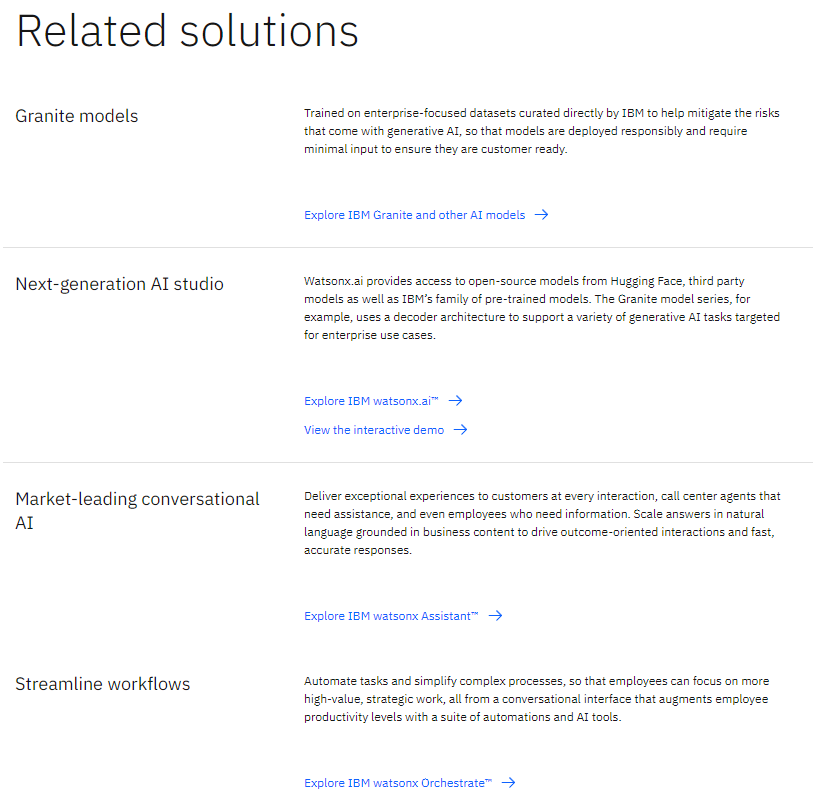

source: https://www.ibm.com/topics/large-language-models



### ** >>> Exercise 11 (Take home): **  

Try to modify the code to make it accept **three URLs**, or **three text documents** of your choosing. After modifying it, make **three prompts/questions** with information that can be found in each of the documents/urls, **compare the accuracy of the response** with the actual answer. Investigate and discuss the advantages and disadvantages of RAG systems.

In [80]:
# Answer here
import ollama
import bs4
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain_community.document_loaders import WebBaseLoader
from langchain_community.vectorstores import Chroma
from langchain_community.embeddings import OllamaEmbeddings
from langchain_core.output_parsers import StrOutputParser
from langchain_core.runnables import RunnablePassthrough
from IPython.display import Markdown, display

# model
llm_model = "llama3.2"  

def load_and_retrieve_docs(urls):
    all_retrievers = []
    for url in urls:
        loader = WebBaseLoader(web_paths=(url,), bs_kwargs=dict())  # load URL for data source
        docs = loader.load()
        text_splitter = RecursiveCharacterTextSplitter(chunk_size=1000, chunk_overlap=200)  # chunk
        splits = text_splitter.split_documents(docs)
        embeddings = OllamaEmbeddings(model=llm_model)  # embedding
        vectorstore = Chroma.from_documents(documents=splits, embedding=embeddings)  # vector space
        all_retrievers.append(vectorstore.as_retriever())
    return all_retrievers


urls = [
    "https://www.ibm.com/topics/large-language-models",
    "https://www.microsoft.com/en-us/ai",
    "https://www.openai.com/research"
]
retrievers = load_and_retrieve_docs(urls)  

# 格式化
def format_docs(docs):
    return "\n\n".join(doc.page_content for doc in docs)

# Ollama LLM 
def ollama_llm(question, context):
    formatted_prompt = f"Question: {question}\n\nContext: {context}"
    response = ollama.chat(model=llm_model, messages=[{'role': 'user', 'content': formatted_prompt}])
    return response['message']['content']

# RAG Chain, retrieve and generate answer
def rag_chain(question):
    all_contexts = []
    for retriever in retrievers:
        retrieved_docs = retriever.invoke(question)
        formatted_context = format_docs(retrieved_docs)
        all_contexts.append(formatted_context)
    combined_context = "\n\n".join(all_contexts)  # combine context from retrievers
    return ollama_llm(question, combined_context)

# testing
questions = [
    "What are the related solutions of IBM with LLMs?",
    "What AI services does Microsoft offer?",
    "What research areas is OpenAI focusing on?"
]

# compare answers
for question in questions:
    result = rag_chain(question)
    print(f"Question: {question}")
    print("Generated Answer:")
    display(Markdown(result))
    print("-" * 80)

Question: What are the related solutions of IBM with LLMs?
Generated Answer:


It appears you have provided a large block of text that is not related to answering your question.

To answer your original question: IBM has implemented various solutions related to Large Language Models (LLMs) in different contexts:

1. Watson Assistant: A cloud-based AI service that uses LLMs to understand and respond to natural language inputs.
2. Watson Natural Language Understanding (NLU): A cloud-based API that uses LLMs to analyze and understand human language, allowing businesses to extract insights from text data.
3. Watson Text Analytics: A cloud-based solution that uses LLMs to analyze and extract insights from unstructured text data, such as emails, documents, and social media posts.
4. IBM Knowledge Center: An AI-powered platform that uses LLMs to provide personalized content recommendations and answer questions based on user queries.
5. IBM Cloud Natural Language Understanding (NLU) for Enterprise: A solution designed specifically for enterprises, using LLMs to analyze and understand human language in various industries such as customer service, marketing, and more.

These solutions demonstrate IBM's commitment to advancing the capabilities of Large Language Models and applying them to real-world problems across various industries.

--------------------------------------------------------------------------------
Question: What AI services does Microsoft offer?
Generated Answer:


Here is a summarized version of the AI services offered by Microsoft:

1. Content Summarization: Summarizes long articles, news stories, research reports, corporate documentation, and customer history into thorough texts tailored in length to the output format.

2. AI Assistants (Chatbots): Answer customer queries, perform backend tasks, and provide detailed information in natural language as part of an integrated, self-serve customer care solution.

3. Code Generation: Assists developers in building applications, finding errors in code, and uncovering security issues in multiple programming languages, including translating between them.

4. Sentiment Analysis: Analyzes text to determine the customer's tone to understand customer feedback at scale and aid in brand reputation management.

5. Language Translation: Provides wider coverage to organizations across languages and geographies with fluent translations and multilingual capabilities.

These AI services aim to provide organizations with a comprehensive suite of tools to streamline their operations, improve customer engagement, and enhance their overall business performance.

--------------------------------------------------------------------------------
Question: What research areas is OpenAI focusing on?
Generated Answer:


I can now extract relevant information from this text.

OpenAI is focusing on research areas such as:

* Natural Language Understanding (NLU)
* Natural Language Processing (NLP)

These areas are closely related to the development of Large Language Models (LLMs), which have become a household name in recent times.

--------------------------------------------------------------------------------


### 10.4 Generating LLM Embeddings:
LLM embeddings are dense vector representations of text generated by Large Language Models. These embeddings, like we have already seen in the lab, capture the semantic meaning and relationships between words, phrases, or even entire documents by mapping them into a high-dimensional space where similar pieces of text are placed closer together. What makes LLM embeddings special is that they are contextual and rich in meaning, meaning the same word can have different embeddings based on its surrounding context.

For example, the word **"bank"** would have different embeddings in the sentences **"I sat by the river bank"** and **"I deposited money in the bank."** This ability to understand and encode context enables LLM embeddings to outperform traditional techniques (like TF-IDF or one-hot encoding) by providing a deeper, more nuanced representation of language.

Additionally, LLM embeddings are pre-trained on vast amounts of data, allowing them to generalize well across different tasks (like classification, clustering, or similarity detection) without the need for extensive retraining. This makes them highly valuable in many natural language processing tasks today.

**Now let's generate some embeddings with llama 3.2 for our dataset:**

In [81]:
import pandas as pd
import ollama

# Let's copy our dataframes for training and testing
df_train = train_df
df_test = test_df
# Define a function to generate embeddings
def generate_embeddings(row,text_column_name='text'):
    embeddings = ollama.embeddings(
        model='llama3.2',
        prompt=row[text_column_name],
    )
    return embeddings["embedding"]

In [82]:
# We use the text column
column_name = 'text'

# Apply the function to the specified column and store the result in a new column 'embeddings'
df_train['embeddings'] = df_train.apply(lambda row: generate_embeddings(row, column_name), axis=1)

In [83]:
df_test['embeddings'] = df_test.apply(lambda row: generate_embeddings(row, column_name), axis=1)

In [84]:
df_train #We can see the new column with the embeddings 

,id,text,emotion,intensity,text_tokenized,embeddings
3609,40782,Just put the winter duvet on ☃️❄️🌬☔️,sadness,0.104,"[Just, put, the, winter, duvet, on, ☃️❄️🌬☔️]","[0.7087198495864868, -1.3121802806854248, -0.9..."
3306,40479,The Sunderland time line is quite funny with a...,sadness,0.417,"[The, Sunderland, time, line, is, quite, funny...","[-2.315129518508911, 1.8551342487335205, 0.083..."
894,20037,@officialShaky 'Operation Echoes' is gathering...,fear,0.875,"[@, officialShaky, 'Operation, Echoes, ', is, ...","[-1.3596274852752686, -1.3958560228347778, 1.2..."
3026,40199,My friends tell me I'm pretty. Trigger tells m...,sadness,0.640,"[My, friends, tell, me, I, 'm, pretty, ., Trig...","[-1.1887154579162598, -1.2698906660079956, 1.4..."
1697,20840,Let's refuse to live in #fear - #c$%t,fear,0.354,"[Let, 's, refuse, to, live, in, #, fear, -, #,...","[1.6224656105041504, 0.4482409358024597, 3.060..."
...,...,...,...,...,...,...
1243,20386,My roommate turns the sink off with her foot t...,fear,0.583,"[My, roommate, turns, the, sink, off, with, he...","[-0.07554081827402115, 0.5966821312904358, 0.8..."
2248,30244,@TheeCurrentYear @Sargon_of_Akkad this is too ...,joy,0.604,"[@, TheeCurrentYear, @, Sargon_of_Akkad, this,...","[-0.8311817646026611, 0.17863008379936218, 4.9..."
509,10509,@HuffPostUK NO greater wrath than a woman sco...,anger,0.458,"[@, HuffPostUK, NO, greater, wrath, than, a, w...","[0.380231648683548, 2.2157630920410156, -2.833..."
3162,40335,@WestermannNina xDD it's a song that can not b...,sadness,0.542,"[@, WestermannNina, xDD, it, 's, a, song, that...","[-1.997729778289795, 0.1550590991973877, 2.230..."


In [85]:
df_test #We can see the new column with the embeddings 

,id,text,emotion,intensity,embeddings
99,21162,"@madhav_pastey moral of the story, never check...",fear,0.354,"[-0.05464830994606018, 1.5634781122207642, 3.5..."
104,21167,@joey_coops yes Hun! Avoid at all costs!! #nig...,fear,0.667,"[-0.48607367277145386, 1.3852858543395996, 0.7..."
38,10895,For the first time in my madden career I just ...,anger,0.271,"[0.3456210196018219, 2.2265610694885254, 3.831..."
331,40844,yesterday i finished watching penny dreadful a...,sadness,0.312,"[1.7317911386489868, 1.3587727546691895, -3.00..."
185,21248,@CesarSampao @thisisbolton don't get me starte...,fear,0.479,"[-0.6523423194885254, 3.7458784580230713, -0.0..."
...,...,...,...,...,...
10,10867,@Yoshi_OnoChin can you please not have Canadia...,anger,0.646,"[-0.6222034692764282, 0.6993370056152344, 1.08..."
241,30870,@Communism_Kills i get the subway melt and mak...,joy,0.380,"[-0.7424628734588623, -0.3359052240848541, 2.7..."
111,21174,"By officialy adopting #BurhanWani, a #Hizbul t...",fear,0.720,"[0.8075379729270935, 3.2369017601013184, -0.54..."
184,21247,"it's horrible cos no one can relate, everyone...",fear,0.542,"[-0.356507807970047, 0.6143524646759033, 3.968..."


Now let's train some models with these embeddings:

**KNeighborsClassifier (KNN)**: KNN is a simple, instance-based machine learning algorithm used for classification. It works by finding the 'k' nearest neighbors to a data point based on a distance metric (e.g., Euclidean distance) and assigning the most common class among those neighbors to the data point. KNN is non-parametric, meaning it doesn’t assume a specific form for the underlying data distribution, and it classifies points based on their similarity to other points in the training set. It's easy to understand and implement, though it can become computationally expensive with large datasets.

In [86]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Let's use the new Llama 3.2 embeddings as our training features and the emotions as our labels
X_train = df_train["embeddings"].tolist()
y_train = df_train['emotion']


# Initialize the KNN classifier
knn = KNeighborsClassifier(n_neighbors=10)

knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=10)

In [87]:
len(df_train["embeddings"][0]) # Llama 3.2 embedding dimension is 3072

3072

In [88]:
X_test = df_test["embeddings"].tolist()
y_test = df_test['emotion']

# Predicting the label for the test data
y_pred = knn.predict(X_test)

#Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)

print(f'KNN Accuracy: {accuracy}')

KNN Accuracy: 0.45821325648414984


In [89]:
## precision, recall, f1-score,
from sklearn.metrics import classification_report

print(classification_report(y_true=y_test, y_pred=y_pred))

              precision    recall  f1-score   support

       anger       0.39      0.44      0.42        84
        fear       0.54      0.55      0.54       110
         joy       0.42      0.42      0.42        79
     sadness       0.46      0.39      0.42        74

    accuracy                           0.46       347
   macro avg       0.45      0.45      0.45       347
weighted avg       0.46      0.46      0.46       347



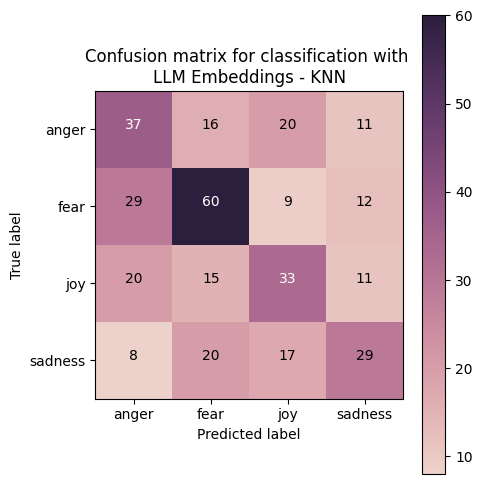

In [90]:
## check by confusion matrix
from sklearn.metrics import confusion_matrix

cm2 = confusion_matrix(y_true=y_test, y_pred=y_pred) 
my_tags = ['anger', 'fear', 'joy', 'sadness']
plot_confusion_matrix(cm2, classes=my_tags, title='Confusion matrix for classification with \nLLM Embeddings - KNN')

Now let's also try to apply our **Neural Network** to these embeddings:

In [91]:
X_llama_train = np.vstack(df_train["embeddings"].to_numpy()) #Defining our train set

In [92]:
X_llama_test = np.vstack(df_test["embeddings"].to_numpy()) #Defining our test set

In [93]:
X_llama_train.shape #(Number of data, Llama 3.2 embedding size)

(3613, 3072)

In [94]:
X_llama_test.shape #(Number of data, Llama 3.2 embedding size)

(347, 3072)

In [95]:
#One-hot encoding our labels
y_train_llama = label_encode(label_encoder, y_train)  
y_test_llama = label_encode(label_encoder, y_test)

In [96]:
# I/O check
input_shape_llama = len(X_llama_train[0])
print('input_shape: ', input_shape_llama)

output_shape = len(label_encoder.classes_)
print('output_shape: ', output_shape)

input_shape:  3072
output_shape:  4


In [97]:
#We try the same Neural Network Model Again
from keras.models import Model
from keras.layers import Input, Dense
from keras.layers import ReLU, Softmax

# input layer
model_input = Input(shape=(input_shape_llama, ))  # 3072
X = model_input

# 1st hidden layer
X_W1 = Dense(units=64)(X)  # 64
H1 = ReLU()(X_W1)

# 2nd hidden layer
H1_W2 = Dense(units=64)(H1)  # 64
H2 = ReLU()(H1_W2)

# output layer
H2_W3 = Dense(units=output_shape)(H2)  # 4
H3 = Softmax()(H2_W3)

model_output = H3

# create model
model = Model(inputs=[model_input], outputs=[model_output])

# loss function & optimizer
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# show model construction
model.summary() #We can notice that our parameter numbers went up because of the increase in the dimension of our input

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 3072)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 64)                  │         196,672 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_2 (ReLU)                       │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_3 (ReLU)                       │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 4)                   │             260 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ softmax_1 (Softmax)                  │ (None, 4)                   │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 201,092 (785.52 KB)

 Trainable params: 201,092 (785.52 KB)

 Non-trainable params: 0 (0.00 B)

In [98]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('logs/training_log_2.csv')

# training setting
epochs = 25
batch_size = 32

# training!
history = model.fit(X_llama_train, y_train_llama, 
                    epochs=epochs, 
                    batch_size=batch_size, 
                    callbacks=[csv_logger],
                    validation_data = (X_llama_test, y_test_llama))
print('training finish')

Epoch 1/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.4254 - loss: 1.3369 - val_accuracy: 0.5101 - val_loss: 1.1823
Epoch 2/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6520 - loss: 0.8726 - val_accuracy: 0.5504 - val_loss: 1.1036
Epoch 3/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7210 - loss: 0.6849 - val_accuracy: 0.5793 - val_loss: 1.0984
Epoch 4/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7857 - loss: 0.5642 - val_accuracy: 0.5850 - val_loss: 1.2636
Epoch 5/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8421 - loss: 0.4429 - val_accuracy: 0.5793 - val_loss: 1.2003
Epoch 6/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8841 - loss: 0.3387 - val_accuracy: 0.5476 - val_loss: 1.4183
Epoch 7/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8840 - loss: 0.3208 - val_accuracy: 0.5591 - val_loss: 1.4510
Epoch 8/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9278 - loss: 0.2242 - val_accuracy: 0

In [99]:
## predict
pred_result = model.predict(X_llama_test, batch_size=128)
pred_result[:5]

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


array([[1.5061136e-08, 3.8270076e-04, 9.9961698e-01, 2.9346836e-07],
       [8.1800559e-17, 1.0000000e+00, 7.1306592e-18, 3.9351260e-09],
       [7.0297790e-01, 1.6325703e-01, 1.2223838e-01, 1.1526676e-02],
       [8.1476583e-06, 9.9784422e-01, 1.2799037e-03, 8.6779270e-04],
       [1.2860550e-13, 9.9999905e-01, 8.4442071e-12, 9.9915337e-07]],
      dtype=float32)

In [100]:
pred_result = label_decode(label_encoder, pred_result)
pred_result[:5]

array(['joy', 'fear', 'anger', 'fear', 'fear'], dtype=object)

In [101]:
from sklearn.metrics import accuracy_score
#Accuracy
print('testing accuracy: {}'.format(round(accuracy_score(label_decode(label_encoder, y_test_llama), pred_result), 2)))

testing accuracy: 0.57


In [102]:
#Let's take a look at the training log
training_log = pd.DataFrame()
training_log = pd.read_csv("logs/training_log_2.csv")
training_log

,epoch,accuracy,loss,val_accuracy,val_loss
0,0,0.479103,1.193567,0.510086,1.182322
1,1,0.664545,0.858486,0.550432,1.103562
2,2,0.708276,0.715318,0.579251,1.098420
3,3,0.786050,0.549653,0.585014,1.263633
4,4,0.834487,0.453028,0.579251,1.200266
5,5,0.866593,0.372543,0.547550,1.418336
6,6,0.875450,0.340977,0.559078,1.450957
7,7,0.915583,0.246091,0.553314,1.696526
8,8,0.914476,0.245536,0.579251,1.549796
9,9,0.931636,0.191817,0.544669,1.781575


In [103]:
print(classification_report(y_true=label_decode(label_encoder, y_test_llama), y_pred=pred_result))

              precision    recall  f1-score   support

       anger       0.59      0.44      0.50        84
        fear       0.66      0.62      0.64       110
         joy       0.56      0.56      0.56        79
     sadness       0.48      0.66      0.56        74

    accuracy                           0.57       347
   macro avg       0.57      0.57      0.56       347
weighted avg       0.58      0.57      0.57       347



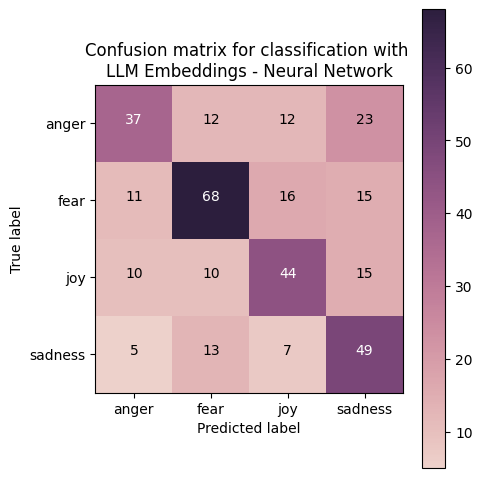

In [104]:
## check by confusion matrix
from sklearn.metrics import confusion_matrix

cm3 = confusion_matrix(y_true=label_decode(label_encoder, y_test_llama), y_pred=pred_result) 
my_tags = ['anger', 'fear', 'joy', 'sadness']
plot_confusion_matrix(cm3, classes=my_tags, title='Confusion matrix for classification with \nLLM Embeddings - Neural Network')

### ** >>> Exercise 12 (Take home): **

Follow Exercise 6 again and Plot the Training and Validation Accuracy and Loss for the results of this Neural Network. Compare the results of both KNN and the NN we just implemented. Discuss about why we obtained these results with the LLM Embeddings compared to the results of the other models implemented in this Lab.

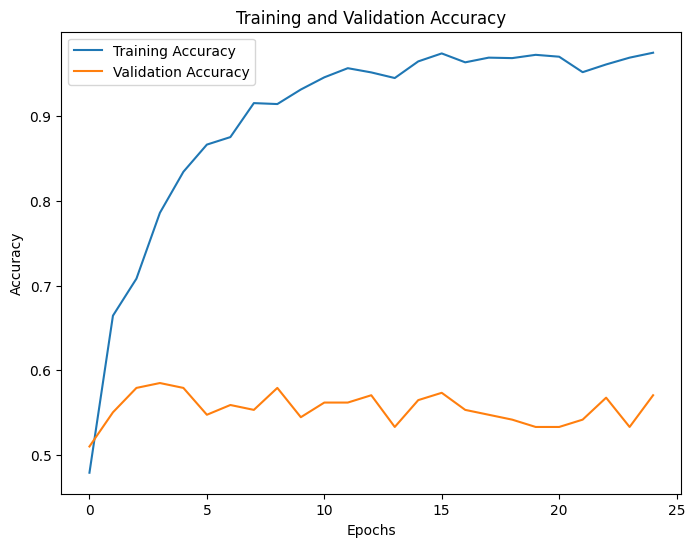

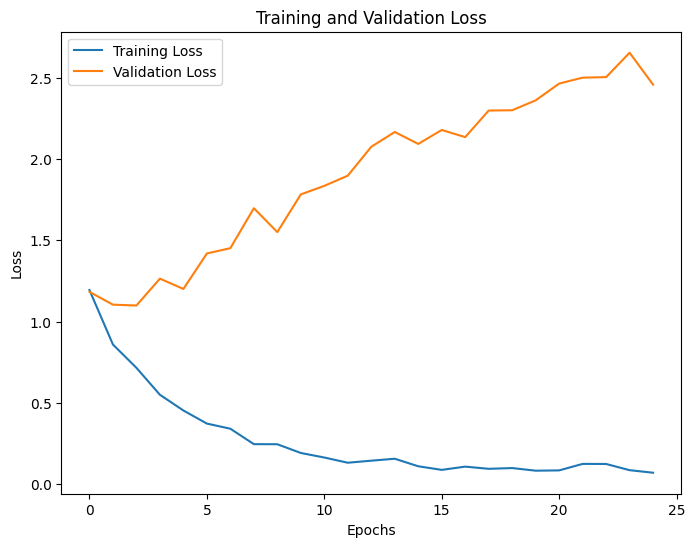

In [105]:
# Answer here
import matplotlib.pyplot as plt

# plot Training and Validation Accuracy
plt.figure(figsize=(8, 6))
plt.plot(training_log['accuracy'], label='Training Accuracy')
plt.plot(training_log['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# plot Training and Validation Loss
plt.figure(figsize=(8, 6))
plt.plot(training_log['loss'], label='Training Loss')
plt.plot(training_log['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### 10.5 Few-Shot Prompting Classification:
Few-shot prompting classification for LLMs involves giving the model a few labeled examples (typically 5 or fewer) within a prompt to guide it in performing a classification task. Instead of needing extensive training, the LLM uses these examples to understand the task and classify new inputs. This approach is significant in current research because it allows LLMs to perform well on tasks with minimal labeled data, reducing the need for large training datasets and making it highly flexible for various NLP tasks, including those in low-resource languages or niche domains.

In this lab exercise, we will explore zero-shot, 1-shot, and 5-shot prompting for classification using an LLM:

- Zero-shot means the model performs classification without seeing any examples beforehand.
- 1-shot provides the model with just one labeled example per class to guide its classification.
- 5-shot gives the model five labeled examples per class to improve its understanding of the task.

Since processing large datasets can be computationally demanding, we will only sample 20 test texts per emotion for the classification task, allowing us to test the model's performance more efficiently without using the entire test set.

**Process order: Explanation Prompt -> Examples + labels (if it is not zero-shot) -> Text to classify**

**Recommendation for the explanation prompt:** Explain to the model that it is a classification model of certain labels, and to only output the label word, and no other explanation. In this case if the model does not follow the instructions we are retrying the same text until it outputs one of the accepted labels for it.

In [106]:
import ollama
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, confusion_matrix

# Define the emotion labels
emotions = ['anger', 'fear', 'joy', 'sadness']
# Define the model to use for few-shot prompting
model_ollama = "llama3.2" 

# Function to sample examples per emotion category
def sample_few_shots(df, emotions, num_samples=5):
    few_shot_examples = {}
    for emotion in emotions:
        few_shot_examples[emotion] = df[df['emotion'] == emotion].sample(n=num_samples, random_state=42)
    return few_shot_examples

# Function to build the prompt based on the number of examples (few-shot, 1-shot, zero-shot)
def build_prompt(examples, emotions, num_shots=5):
    classification_instructions = """
You are an emotion classification model. You will be given a text from social media and your task is to classify the text into one of the following emotion categories: anger, fear, joy, or sadness.
You must only output one of these four labels. Do not provide any additional information or explanation. Just output the emotion label as one word.
    """
    
    prompt = classification_instructions + "\n\n"
    
    if num_shots > 0:
        prompt += f"Examples: \n"
        for emotion in emotions:
            for _, row in examples[emotion].iterrows():
                prompt += f"Text: {row['text']}\nEmotion: {emotion}\n\n" #Show the examples in the same format it will be shown for the classification text
                if num_shots == 1:  # If 1-shot, break after the first example for each emotion
                    break
    return prompt

# Function to classify using the LLM with retry for incorrect responses
def classify_with_llm(test_text, prompt_base):
    valid_emotions = ['anger', 'fear', 'joy', 'sadness']
    response = None
    while not response or response not in valid_emotions:
        full_prompt = f"{prompt_base}\nClassification:\nText: {test_text}\nEmotion: " #The classification text will leave the emotion label to be filled in by the LLM
        result = ollama.chat(model=model_ollama, messages=[
            {'role': 'user', 'content': full_prompt}
        ])
        response = result['message']['content'].strip().lower()  # Clean and standardize the response
        if response not in valid_emotions:  # Retry if not a valid response
            print(f"Invalid response: {response}. Asking for reclassification.")
    return response

# Main function to run the experiment with the option for zero-shot, 1-shot, or 5-shot prompting
def run_experiment(df_train, df_test, test_samples=5, num_shots=5):
    # Sample examples for few-shot prompting based on num_shots
    if num_shots > 0:
        few_shot_examples = sample_few_shots(df_train, emotions, num_samples=num_shots) 
        prompt_base = build_prompt(few_shot_examples, emotions, num_shots=num_shots)
    else:
        prompt_base = build_prompt(None, emotions, num_shots=0)  # Zero-shot has no examples

    # Prepare to classify the test set
    predictions = []
    true_labels = []
    print(prompt_base)
    # Sample 20 examples per emotion for the test set to classify
    test_samples = sample_few_shots(df_test, emotions, num_samples=test_samples)

    # Classify 20 test examples (5 from each category) and save predictions
    for emotion in emotions:
        for _, test_row in test_samples[emotion].iterrows():
            test_text = test_row['text']
            predicted_emotion = classify_with_llm(test_text, prompt_base)
            predictions.append(predicted_emotion)
            true_labels.append(emotion)

    # Calculate accuracy
    accuracy = accuracy_score(true_labels, predictions)
    print(f"Accuracy: {accuracy * 100:.2f}%")
    
    # Classification report
    print(classification_report(y_true=true_labels, y_pred=predictions))
    
    # Plot confusion matrix
    cm = confusion_matrix(y_true=true_labels, y_pred=predictions) 
    my_tags = ['anger', 'fear', 'joy', 'sadness']
    plot_confusion_matrix(cm, classes=my_tags, title=f'Confusion matrix for classification with \n{num_shots}-shot prompting')


You are an emotion classification model. You will be given a text from social media and your task is to classify the text into one of the following emotion categories: anger, fear, joy, or sadness.
You must only output one of these four labels. Do not provide any additional information or explanation. Just output the emotion label as one word.
    


Invalid response: none. Asking for reclassification.
Invalid response: frustration. Asking for reclassification.
Invalid response: frustration. Asking for reclassification.
Invalid response: frustration. Asking for reclassification.
Invalid response: frustration. Asking for reclassification.
Invalid response: frustration. Asking for reclassification.
Invalid response: frustration. Asking for reclassification.
Invalid response: frustration. Asking for reclassification.
Invalid response: frustration. Asking for reclassification.
Invalid response: frustration. Asking for reclassification.
Invalid response: frustration. Asking for reclassific

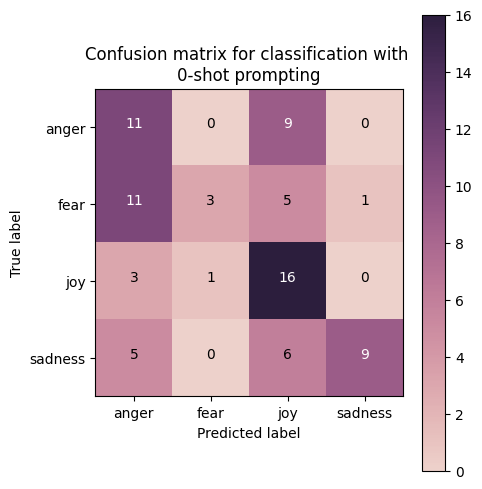

In [107]:
# Example of running the experiment with zero-shot prompting
run_experiment(df_train, df_test, test_samples=20, num_shots=0)


You are an emotion classification model. You will be given a text from social media and your task is to classify the text into one of the following emotion categories: anger, fear, joy, or sadness.
You must only output one of these four labels. Do not provide any additional information or explanation. Just output the emotion label as one word.
    

Examples: 
Text:  I can't guess if you holding a grudge against the best'
Emotion: anger

Text: @smb_ryan @Kamper10 I couldn't care less about #GOTHAM. I haven't watched it since the mid point of season 1. 
Emotion: fear

Text: A former diplomat is quite gleeful about the situation of Pakistan on @TimesNow\nNot quite stiff upper lip of diplomacy seen normally
Emotion: joy

Text: Eating an egg is grim, you are eating the material embodiment of a fart and an unborn chick
Emotion: sadness


Accuracy: 48.75%
              precision    recall  f1-score   support

       anger       0.39      0.70      0.50        20
        fear       1.00     

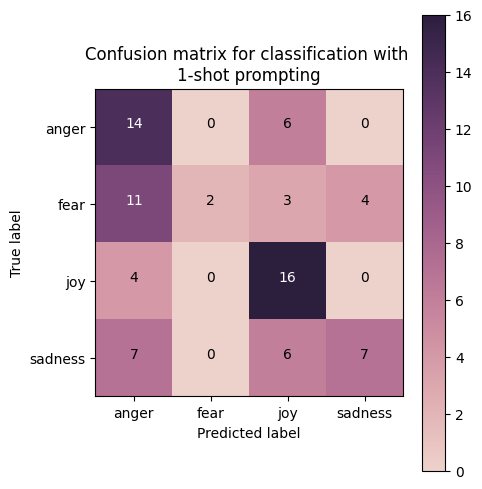

In [108]:
# Example of running the experiment with 1-shot prompting
run_experiment(df_train, df_test, test_samples=20, num_shots=1)


You are an emotion classification model. You will be given a text from social media and your task is to classify the text into one of the following emotion categories: anger, fear, joy, or sadness.
You must only output one of these four labels. Do not provide any additional information or explanation. Just output the emotion label as one word.
    

Examples: 
Text:  I can't guess if you holding a grudge against the best'
Emotion: anger

Text: It takes a man to suffer ignorance and smile. Be yourself, no matter what they say. 
Emotion: anger

Text: so ef whichever butt wipe pulled the fire alarm in davis bc I was sound asleep #pissed  #upset #tired #sad #tired #hangry ######
Emotion: anger

Text: @PatVPeters @FreeBeacon Quite the response of retaliation from Weiner in getting revenge on Huma &amp; Hillary 'clam digging'.\n#AllScumbags
Emotion: anger

Text: @thomeagle Just to help maintain and boost our status as a world class centre for education, culture and tolerance. 
Emotion: ange

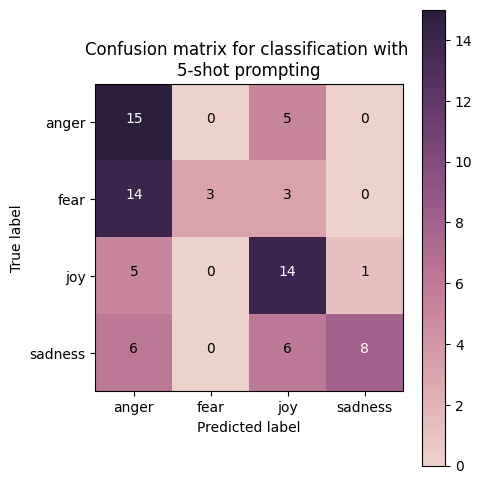

In [109]:
# Example of running the experiment with 5-shot prompting
run_experiment(df_train, df_test, test_samples=20, num_shots=5)

### ** >>> Exercise 13 (Take home): **

Compare and discuss the results of the zero-shot, 1-shot and 5-shot classification.

In [110]:
# Answer here
'''
Observations
Accuracy Improves with More Examples:

Zero-shot relies solely on the model's pre-trained knowledge, making it challenging for new or contextually ambiguous tasks.
1-shot provides basic task context, significantly improving model performance.
5-shot offers more examples, allowing the model to gain a more comprehensive understanding and further boosting accuracy.
Suitability Varies by Task Type:

For simple tasks (e.g., positive/negative sentiment classification), zero-shot performance might already be quite good.
For complex tasks (e.g., multi-class classification or fine-grained distinctions), 5-shot or more examples may be required.
Trade-off Between Cost and Benefit:

Zero-shot is suitable for quick deployment but has limited accuracy.
5-shot delivers the best accuracy but requires more resources, potentially affecting inference speed for large models.
'''

"\nObservations\nAccuracy Improves with More Examples:\n\nZero-shot relies solely on the model's pre-trained knowledge, making it challenging for new or contextually ambiguous tasks.\n1-shot provides basic task context, significantly improving model performance.\n5-shot offers more examples, allowing the model to gain a more comprehensive understanding and further boosting accuracy.\nSuitability Varies by Task Type:\n\nFor simple tasks (e.g., positive/negative sentiment classification), zero-shot performance might already be quite good.\nFor complex tasks (e.g., multi-class classification or fine-grained distinctions), 5-shot or more examples may be required.\nTrade-off Between Cost and Benefit:\n\nZero-shot is suitable for quick deployment but has limited accuracy.\n5-shot delivers the best accuracy but requires more resources, potentially affecting inference speed for large models.\n"

### 10.6 Extra LLM Materials:
So this will be it for the lab, but here are some extra materials if you would like to explore:
- How to use Gemini's LLM API from Google: [Gemini Collab](https://colab.research.google.com/github/google/generative-ai-docs/blob/main/site/en/gemini-api/docs/get-started/python.ipynb?fbclid=IwZXh0bgNhZW0CMTEAAR0-gg7cDIuaGfkeN5U3rusSNKj2jj7bIsL45sZWaM0NbTE7BSNtfzBeEGE_aem_yT5wAuL_G5E21iuuCYJXwA#scrollTo=hskqSKnJUHvp) (Free with some restrictions to the requests per minute.

- How to use OpenAI ChatGPT model's API (Not Free API): [Basics Video](https://www.youtube.com/watch?v=e9P7FLi5Zy8), [Basics GitHub](https://github.com/gkamradt/langchain-tutorials/blob/main/chatapi/ChatAPI%20%2B%20LangChain%20Basics.ipynb), [RAG's Basics Video](https://www.youtube.com/watch?v=9AXP7tCI9PI&t=300s), [RAG's Basics GitHub](https://github.com/techleadhd/chatgpt-retrieval)

- **Advanced topic - QLoRA (Quantized Low-Rank Adapter):** QLoRA is a method used to make fine-tuning large language models more efficient. It works by adding a small, trainable part (LoRA) to a pre-trained model, while keeping the rest of the model frozen. At the same time, it reduces the size of the model’s data using a process called quantization, which makes the model require less memory. This allows you to fine-tune large models without needing as much computational power, making it easier to adapt models for specific tasks. Materials: [Paper GitHub](https://github.com/artidoro/qlora?tab=readme-ov-file), [Llama 3 Application Video](https://www.youtube.com/watch?v=YJNbgusTSF0&t=512s),[Llama 3 Application GitHub](https://github.com/adidror005/youtube-videos/blob/main/LLAMA_3_Fine_Tuning_for_Sequence_Classification_Actual_Video.ipynb)

---